## Importing The Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
sns.set_style('darkgrid')

## Importing The Dataset

In [2]:
df = pd.read_csv('day.csv',index_col=0)

In [3]:
df.head()

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,,,,,,,,,,,,,,,
1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 731 entries, 1 to 731
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   dteday      731 non-null    object 
 1   season      731 non-null    int64  
 2   yr          731 non-null    int64  
 3   mnth        731 non-null    int64  
 4   holiday     731 non-null    int64  
 5   weekday     731 non-null    int64  
 6   workingday  731 non-null    int64  
 7   weathersit  731 non-null    int64  
 8   temp        731 non-null    float64
 9   atemp       731 non-null    float64
 10  hum         731 non-null    float64
 11  windspeed   731 non-null    float64
 12  casual      731 non-null    int64  
 13  registered  731 non-null    int64  
 14  cnt         731 non-null    int64  
dtypes: float64(4), int64(10), object(1)
memory usage: 91.4+ KB


In [5]:
df = df.rename(columns={'dteday':'Date','season':'Season','yr':'Year','mnth':'Month',
                   'holiday':'Holiday','weekday':'Weekday','workingday':'Working Day',
                   'weathersit':'Weather Situation','temp':'Temperature','atemp':
                   'Feeling Temperature','hum':'Humidity','windspeed':'Windspeed',
                   'casual':'Casual','registered':'Registered','cnt':'Total Count'})

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Season,731.0,2.496580,1.110807,1.000000,2.000000,3.000000,3.000000,4.000000
Year,731.0,0.500684,0.500342,0.000000,0.000000,1.000000,1.000000,1.000000
Month,731.0,6.519836,3.451913,1.000000,4.000000,7.000000,10.000000,12.000000
Holiday,731.0,0.028728,0.167155,0.000000,0.000000,0.000000,0.000000,1.000000
Weekday,731.0,2.997264,2.004787,0.000000,1.000000,3.000000,5.000000,6.000000
Working Day,731.0,0.683995,0.465233,0.000000,0.000000,1.000000,1.000000,1.000000
Weather Situation,731.0,1.395349,0.544894,1.000000,1.000000,1.000000,2.000000,3.000000
Temperature,731.0,0.495385,0.183051,0.059130,0.337083,0.498333,0.655417,0.861667
Feeling Temperature,731.0,0.474354,0.162961,0.079070,0.337842,0.486733,0.608602,0.840896
Humidity,731.0,0.627894,0.142429,0.000000,0.520000,0.626667,0.730209,0.972500


## Missing Value Analysis

In [7]:
Missing_Values = pd.DataFrame(df.isna().sum(),columns=['No Of Missing Values'])
Missing_Values

,No Of Missing Values
Date,0
Season,0
Year,0
Month,0
Holiday,0
Weekday,0
Working Day,0
Weather Situation,0
Temperature,0
Feeling Temperature,0


## Data Visualisation

Season

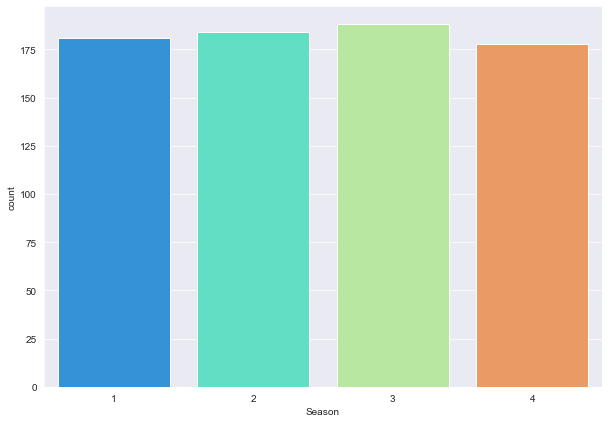

In [8]:
plt.figure(figsize=(10,7))

sns.countplot(df['Season'],palette='rainbow')

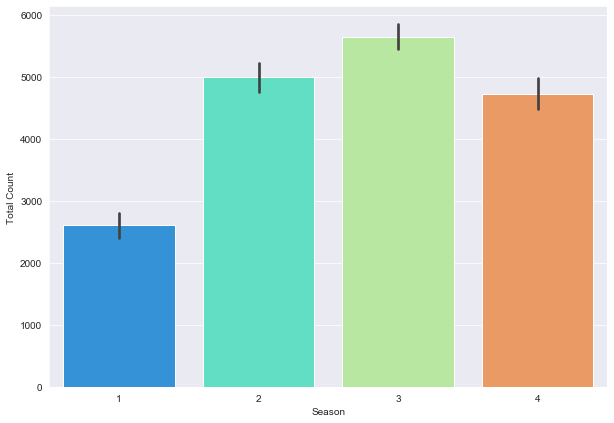

In [9]:
plt.figure(figsize=(10,7))

sns.barplot(x='Season',y='Total Count',data=df,palette='rainbow')

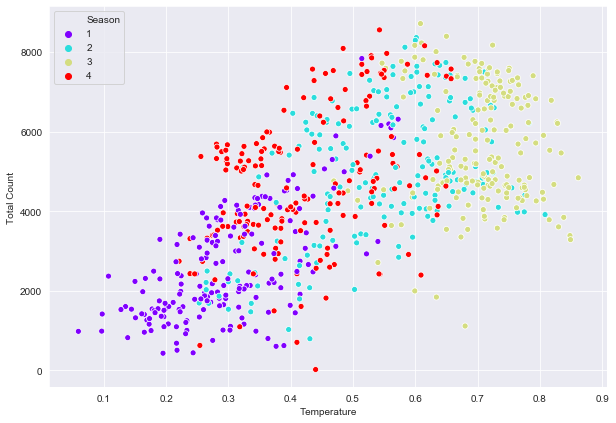

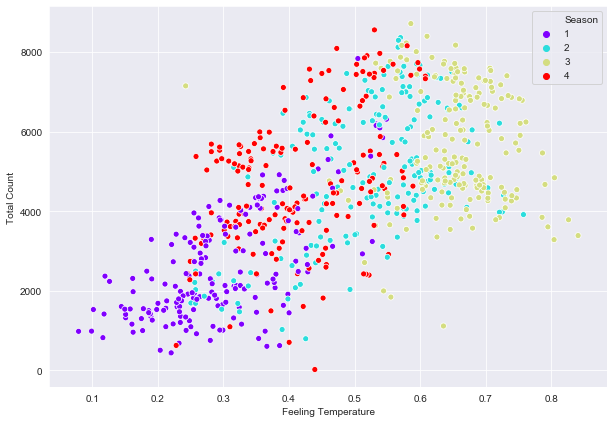

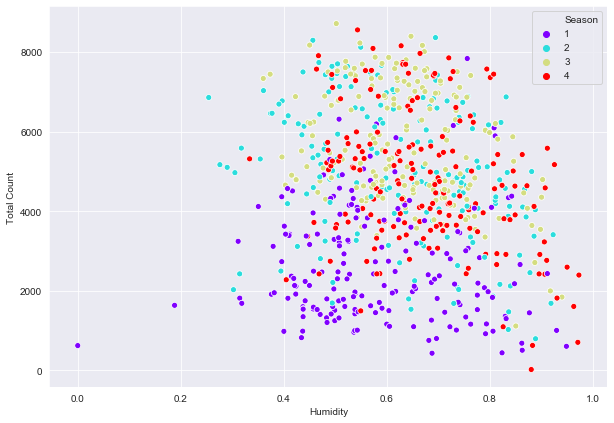

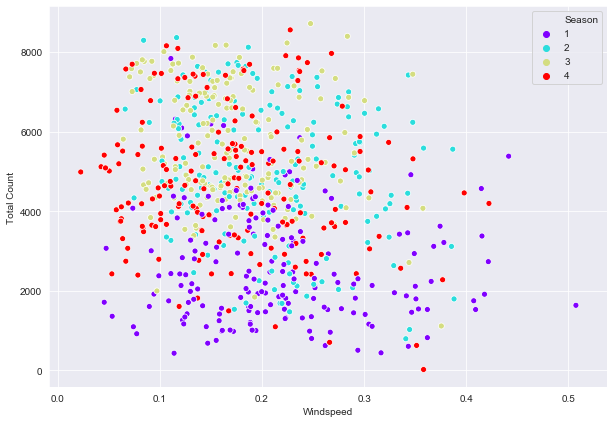

In [10]:
for i in df[['Temperature', 'Feeling Temperature', 'Humidity','Windspeed']]:
    plt.figure(figsize=(10,7))
    sns.scatterplot(data=df,x=i,y='Total Count',hue='Season',palette='rainbow')

Year

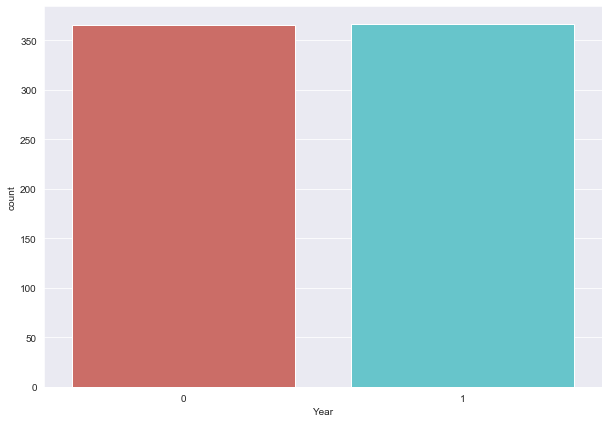

In [11]:
plt.figure(figsize=(10,7))

sns.countplot(df['Year'],palette='hls')

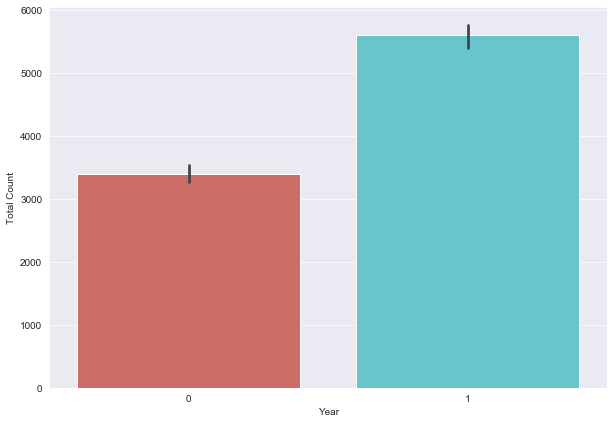

In [12]:
plt.figure(figsize=(10,7))

sns.barplot(x='Year',y='Total Count',data=df,palette='hls')

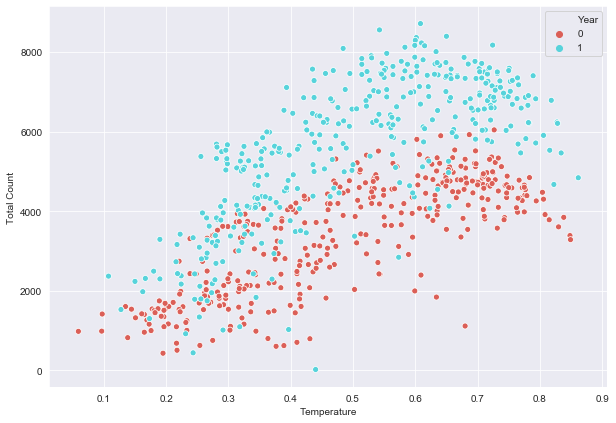

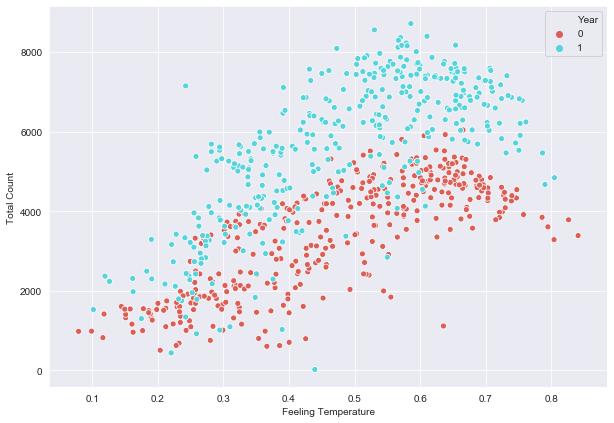

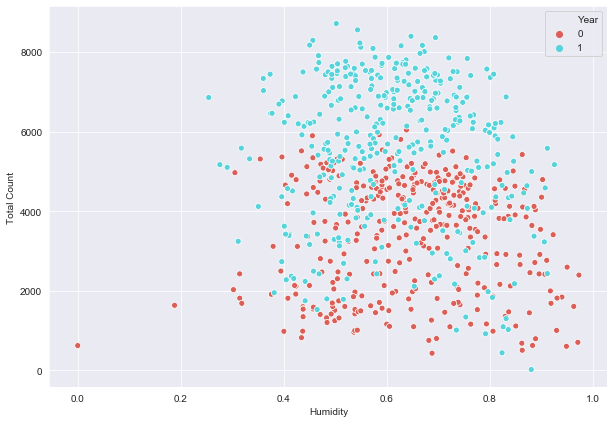

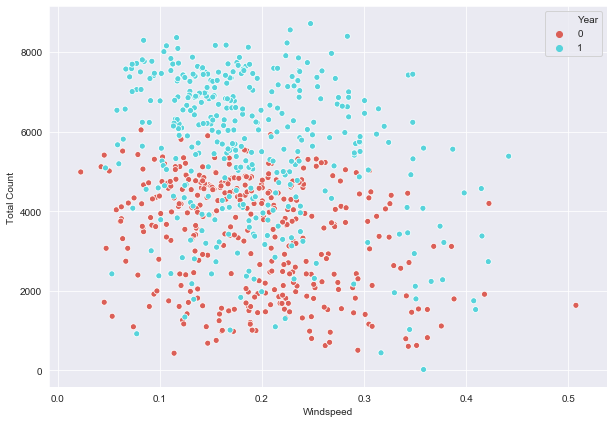

In [13]:
for i in df[['Temperature', 'Feeling Temperature', 'Humidity','Windspeed']]:
    plt.figure(figsize=(10,7))
    sns.scatterplot(data=df,x=i,y='Total Count',hue='Year',palette='hls')

Month

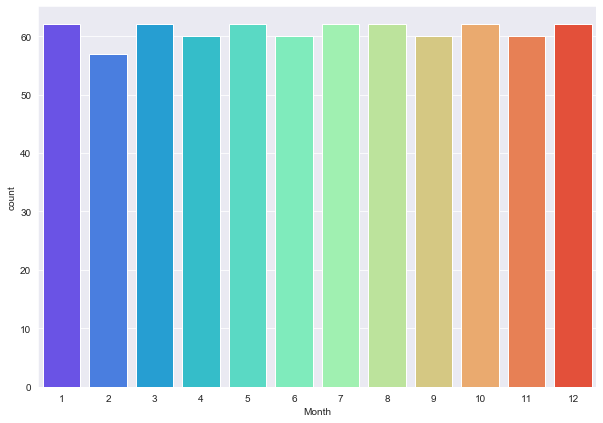

In [14]:
plt.figure(figsize=(10,7))

sns.countplot(df['Month'],palette='rainbow')

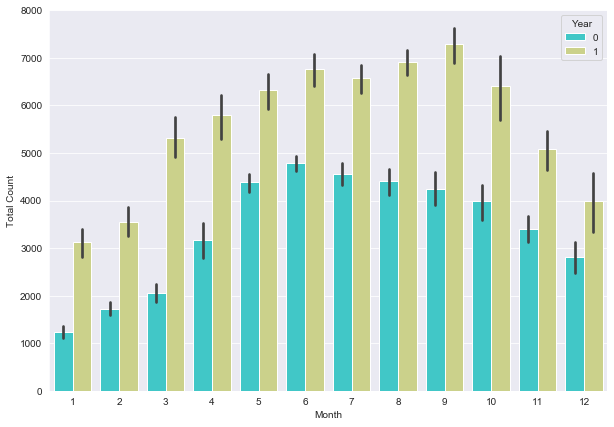

In [15]:
plt.figure(figsize=(10,7))

sns.barplot(x='Month',y='Total Count',data=df,palette='rainbow',hue='Year')

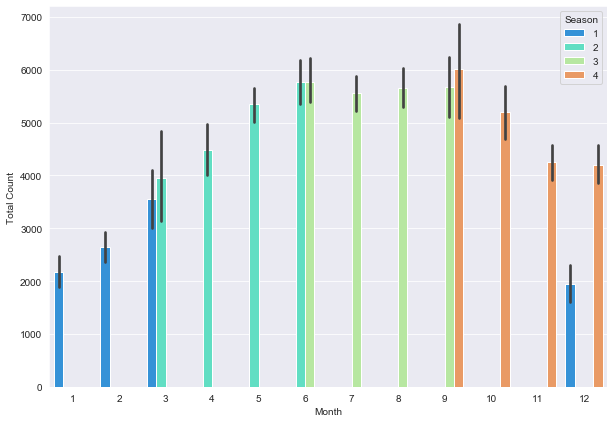

In [16]:
plt.figure(figsize=(10,7))

sns.barplot(x='Month',y='Total Count',data=df,palette='rainbow',hue='Season')

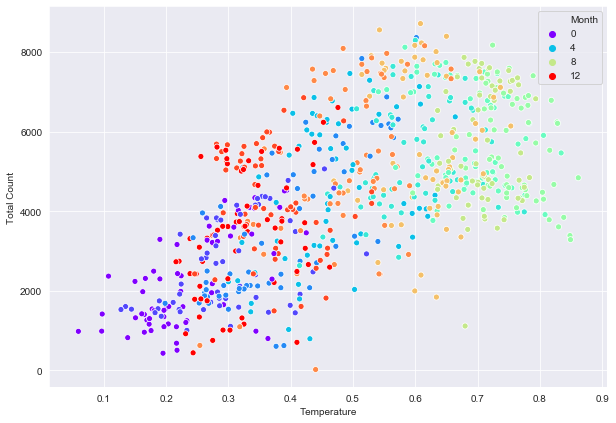

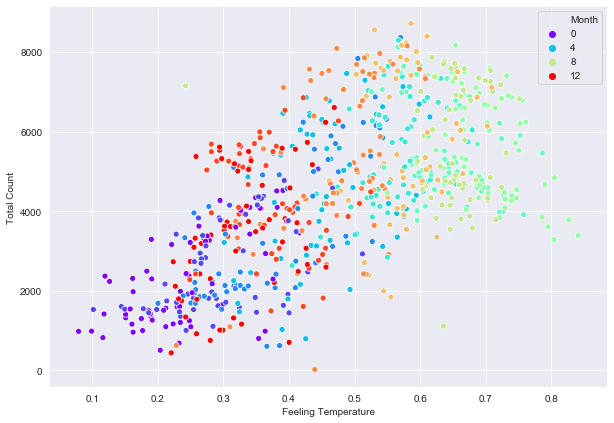

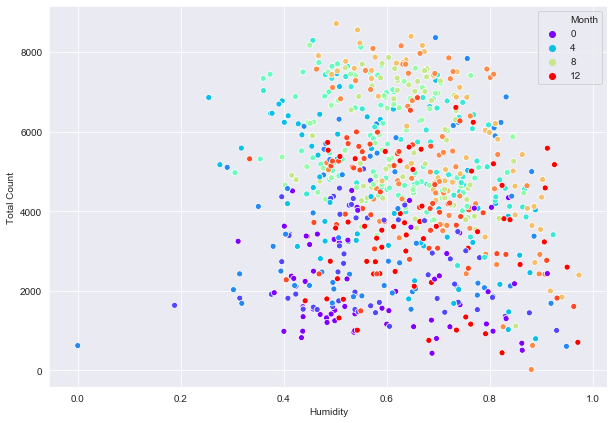

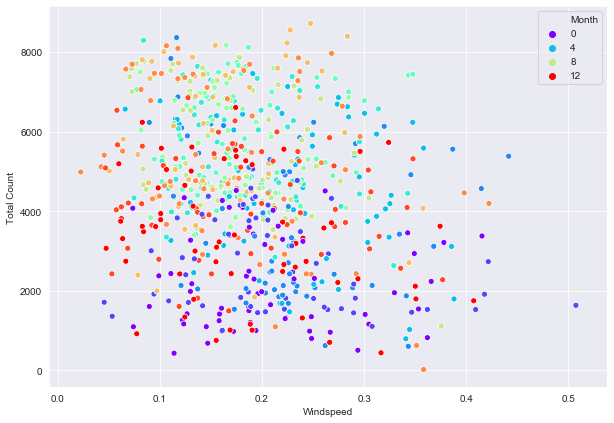

In [17]:
for i in df[['Temperature', 'Feeling Temperature', 'Humidity','Windspeed']]:
    plt.figure(figsize=(10,7))
    sns.scatterplot(data=df,x=i,y='Total Count',hue='Month',palette='rainbow')

Holiday

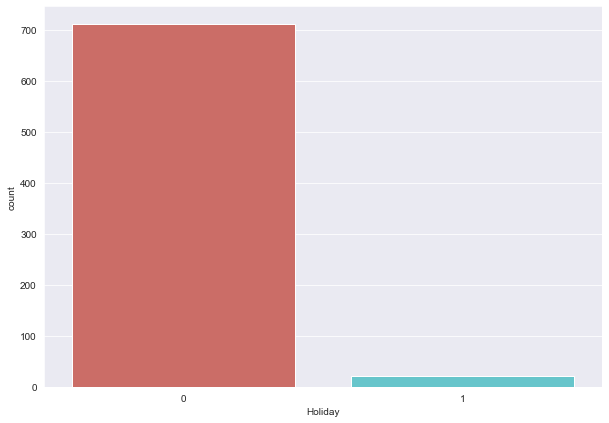

In [18]:
plt.figure(figsize=(10,7))

sns.countplot(df['Holiday'],palette='hls')

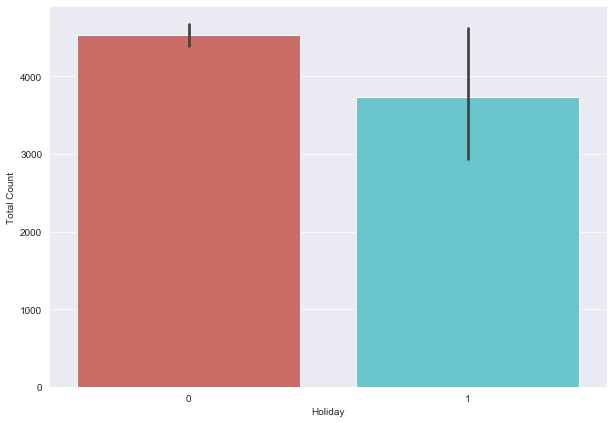

In [19]:
plt.figure(figsize=(10,7))

sns.barplot(x='Holiday',y='Total Count',data=df,palette='hls')

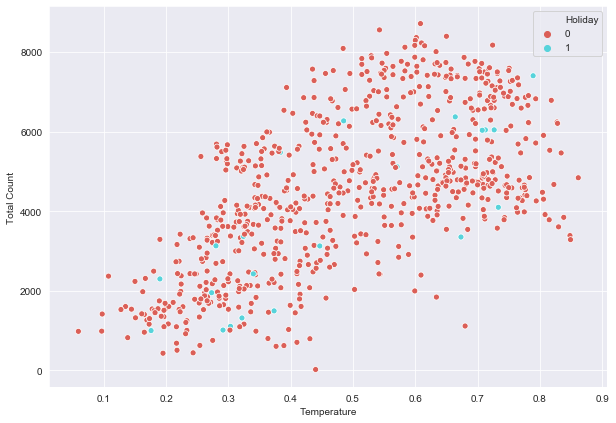

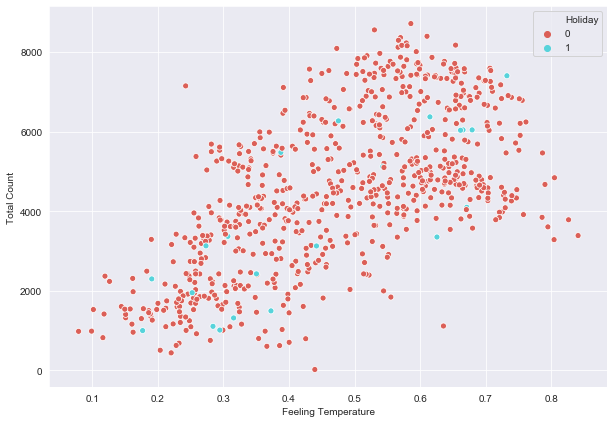

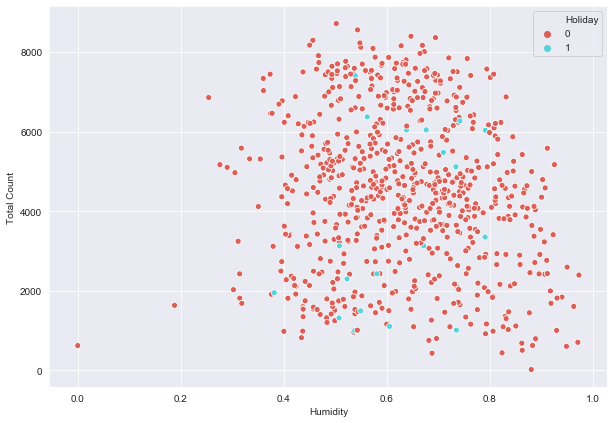

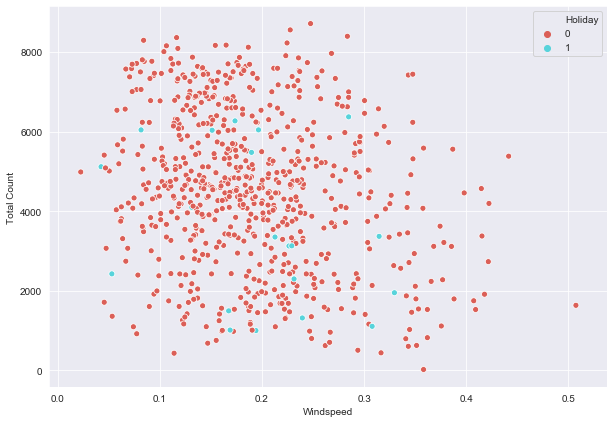

In [20]:
for i in df[['Temperature', 'Feeling Temperature', 'Humidity','Windspeed']]:
    plt.figure(figsize=(10,7))
    sns.scatterplot(data=df,x=i,y='Total Count',hue='Holiday',palette='hls')

Weekday

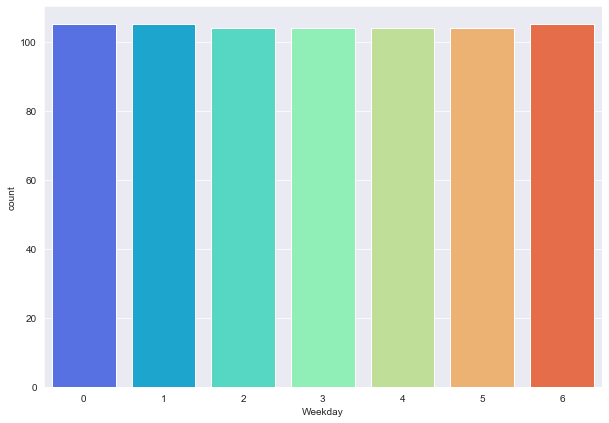

In [21]:
plt.figure(figsize=(10,7))

sns.countplot(df['Weekday'],palette='rainbow')

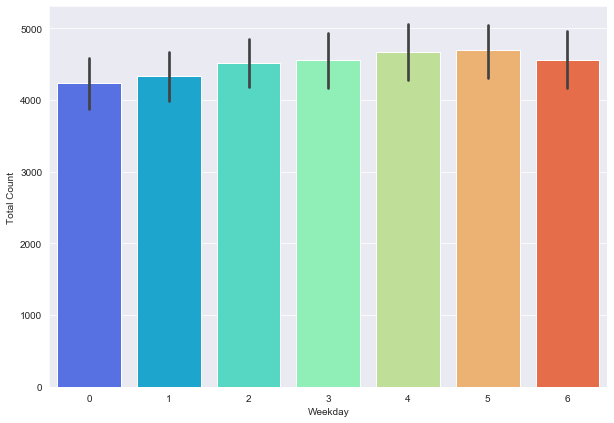

In [22]:
plt.figure(figsize=(10,7))

sns.barplot(x='Weekday',y='Total Count',data=df,palette='rainbow')

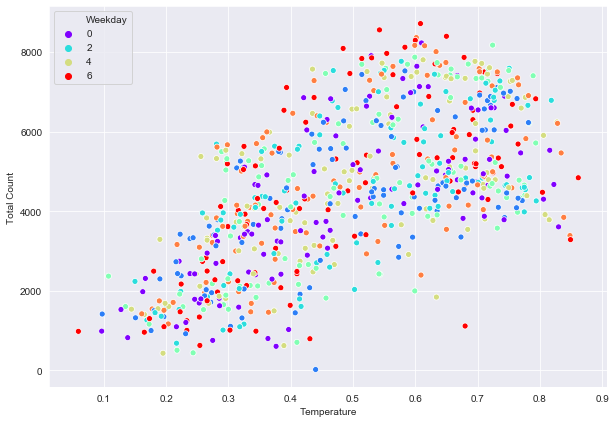

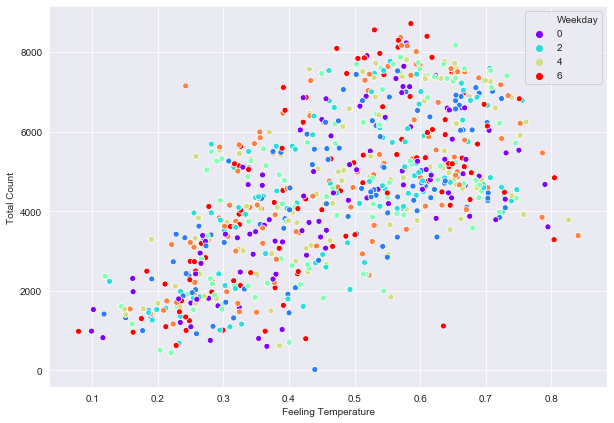

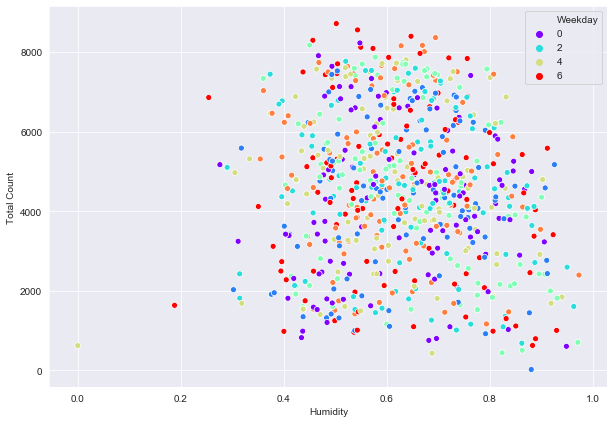

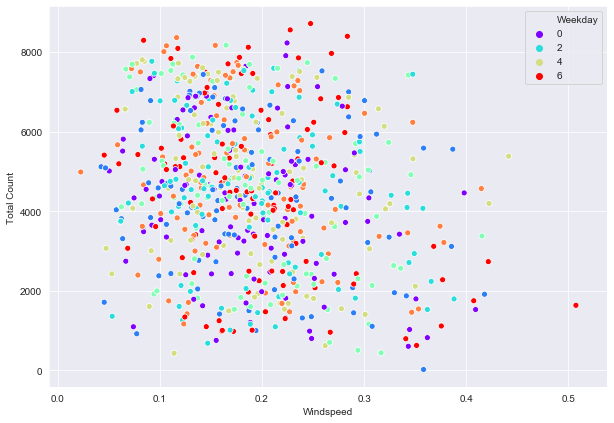

In [23]:
for i in df[['Temperature', 'Feeling Temperature', 'Humidity','Windspeed']]:
    plt.figure(figsize=(10,7))
    sns.scatterplot(data=df,x=i,y='Total Count',hue='Weekday',palette='rainbow')

Working Day

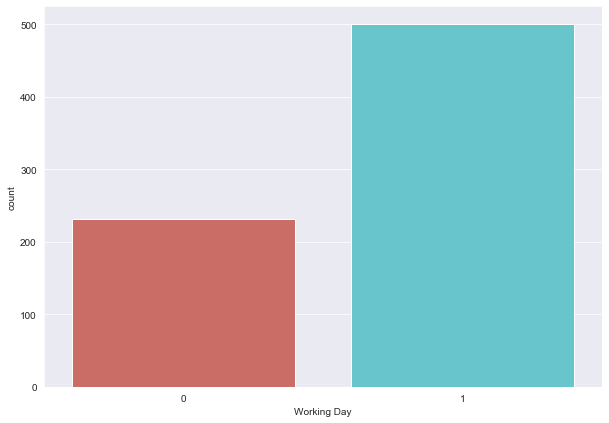

In [24]:
plt.figure(figsize=(10,7))

sns.countplot(df['Working Day'],palette='hls')

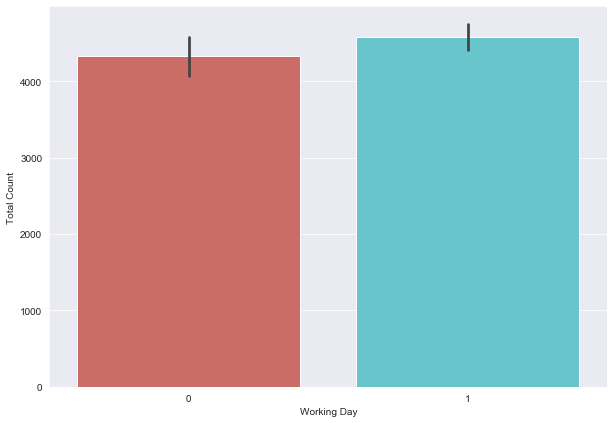

In [25]:
plt.figure(figsize=(10,7))

sns.barplot(x='Working Day',y='Total Count',data=df,palette='hls')

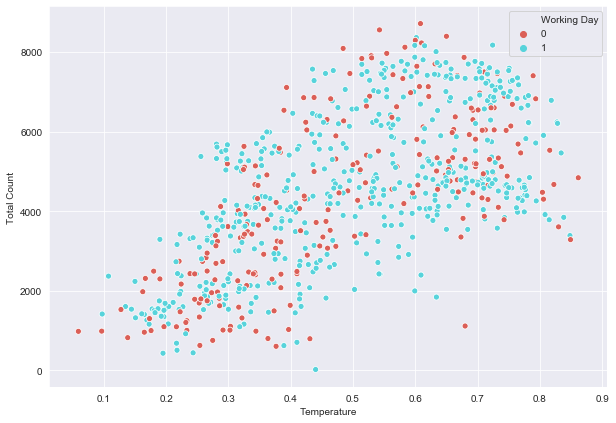

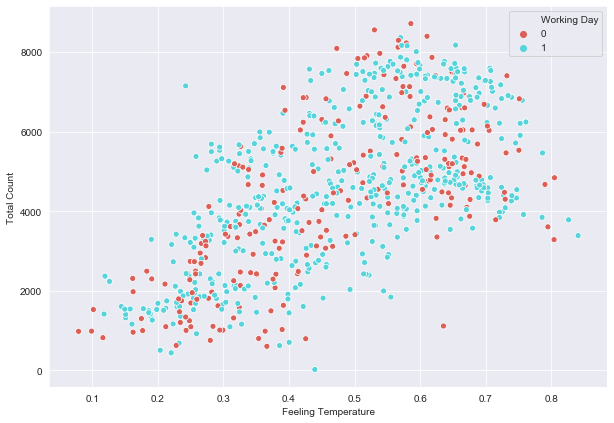

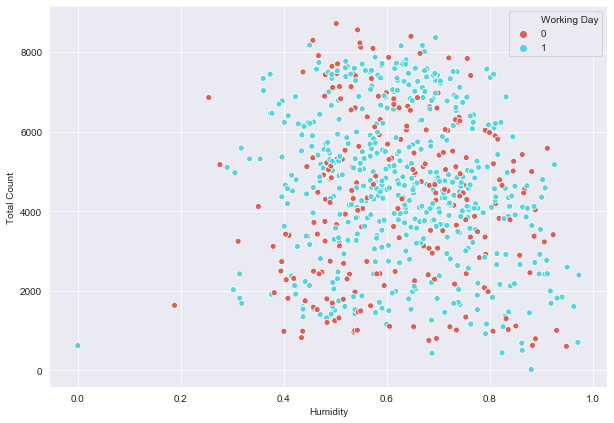

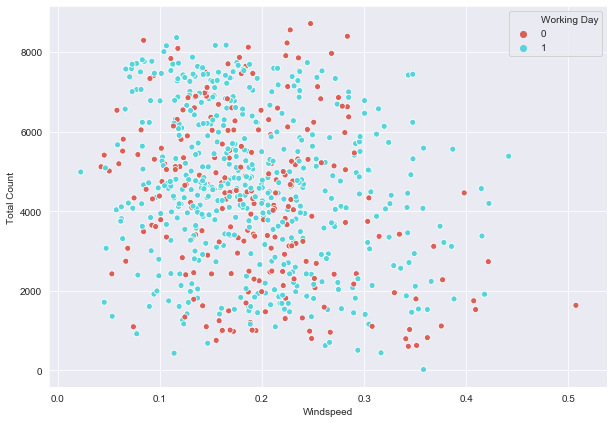

In [26]:
for i in df[['Temperature', 'Feeling Temperature', 'Humidity','Windspeed']]:
    plt.figure(figsize=(10,7))
    sns.scatterplot(data=df,x=i,y='Total Count',hue='Working Day',palette='hls')

Weather Situation

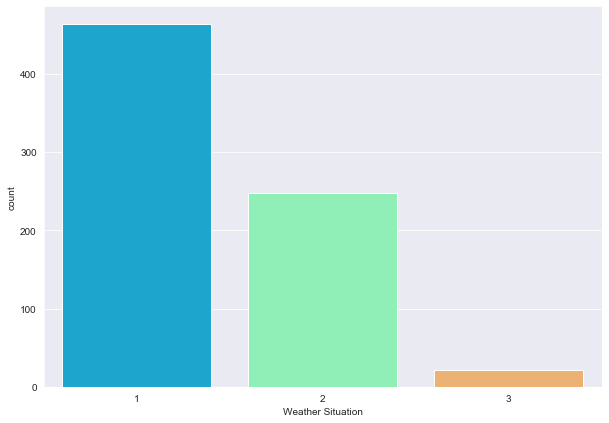

In [27]:
plt.figure(figsize=(10,7))

sns.countplot(df['Weather Situation'],palette='rainbow')

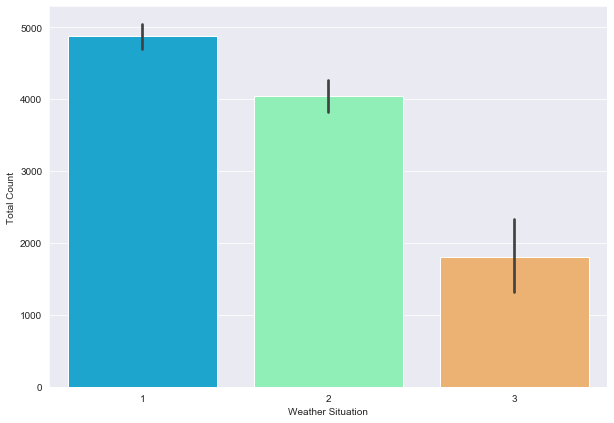

In [28]:
plt.figure(figsize=(10,7))

sns.barplot(x='Weather Situation',y='Total Count',data=df,palette='rainbow')

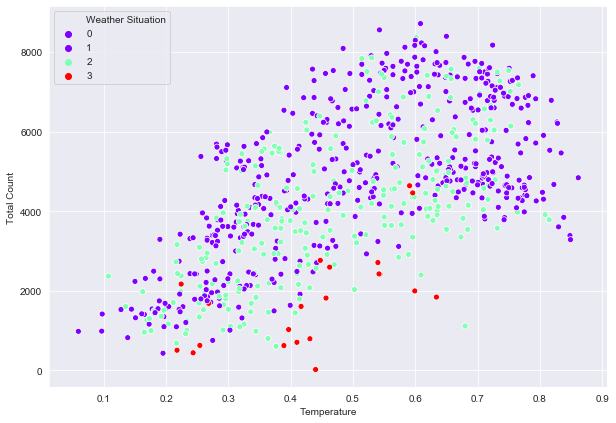

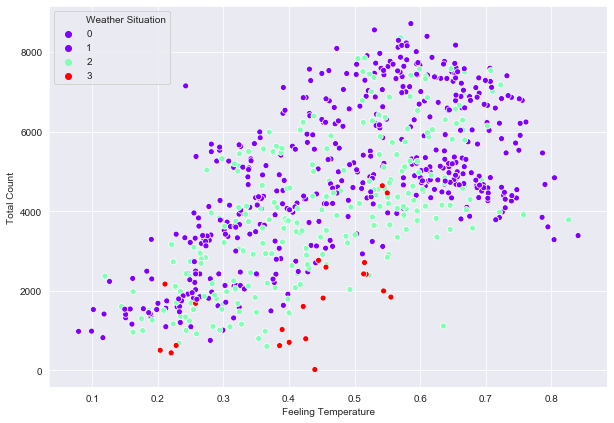

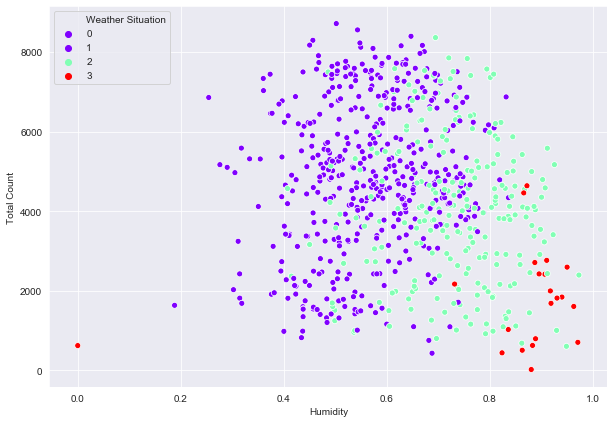

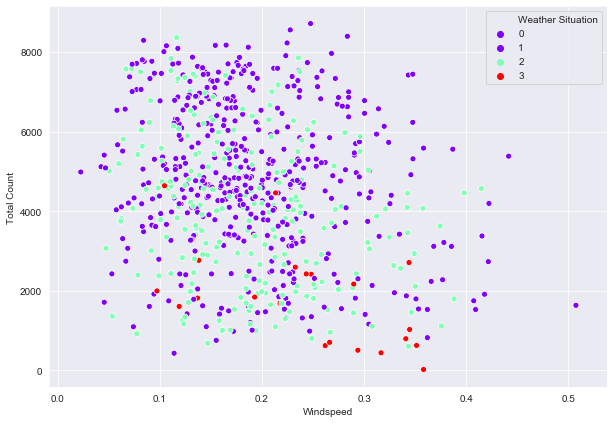

In [29]:
for i in df[['Temperature', 'Feeling Temperature', 'Humidity','Windspeed']]:
    plt.figure(figsize=(10,7))
    sns.scatterplot(data=df,x=i,y='Total Count',hue='Weather Situation',palette='rainbow')

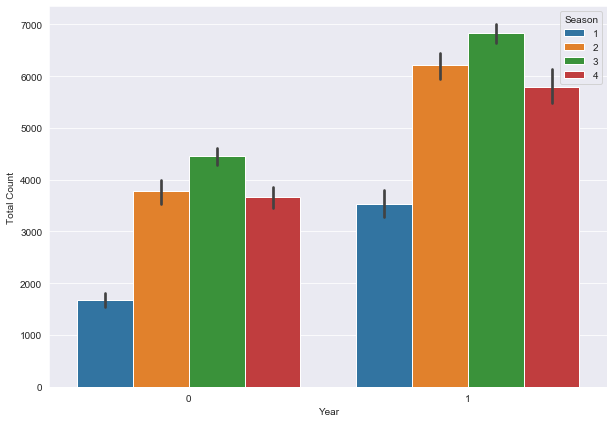

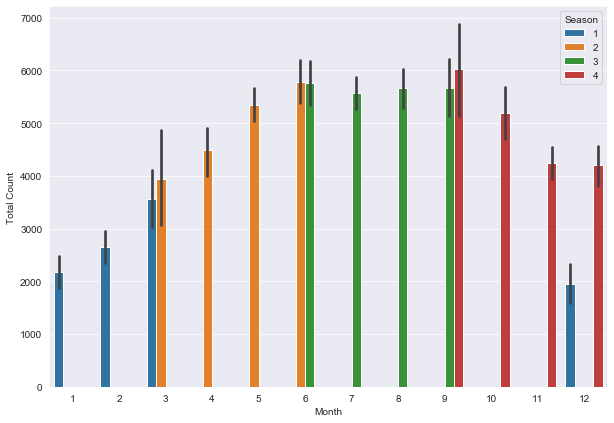

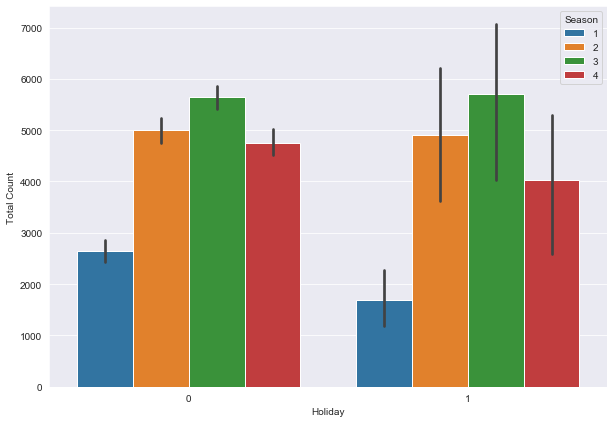

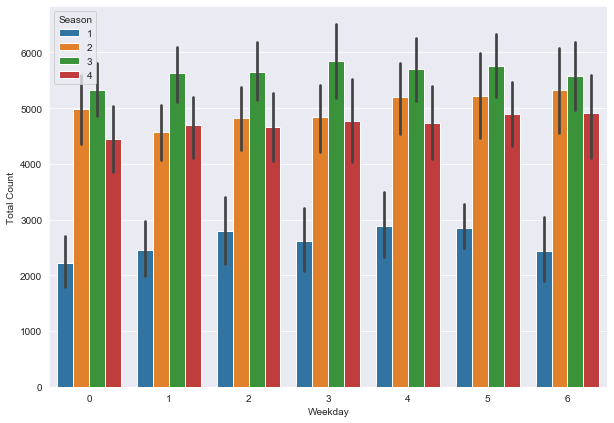

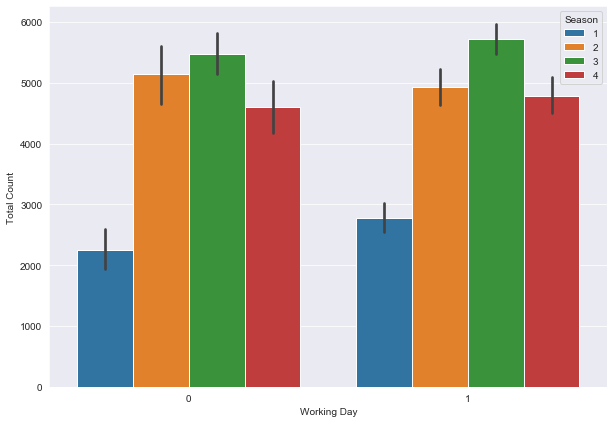

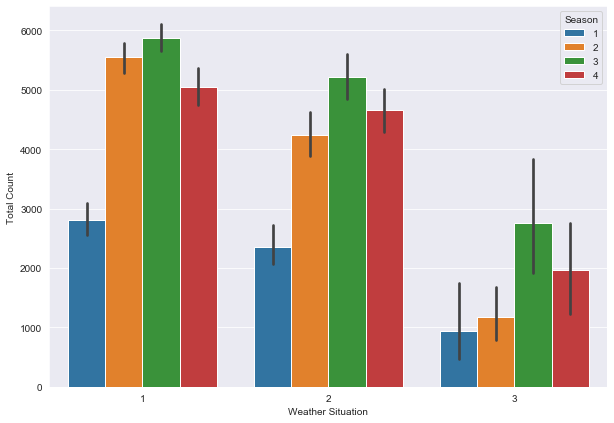

In [30]:
for i in df[['Year', 'Month', 'Holiday', 'Weekday', 'Working Day','Weather Situation']]:
    plt.figure(figsize=(10,7))
    sns.barplot(data=df,x=i,y='Total Count',hue='Season')

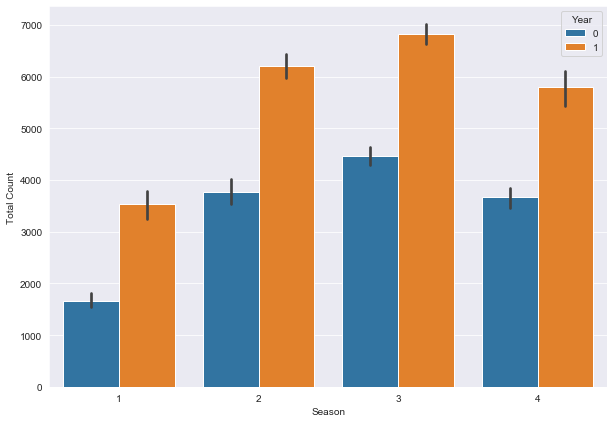

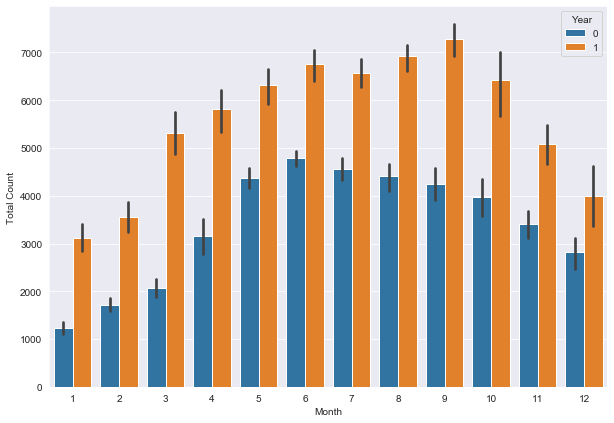

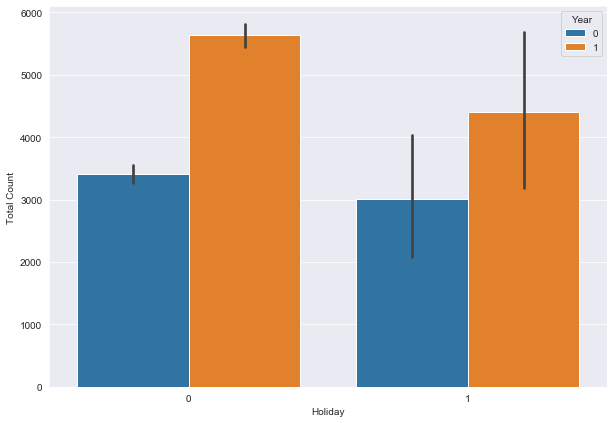

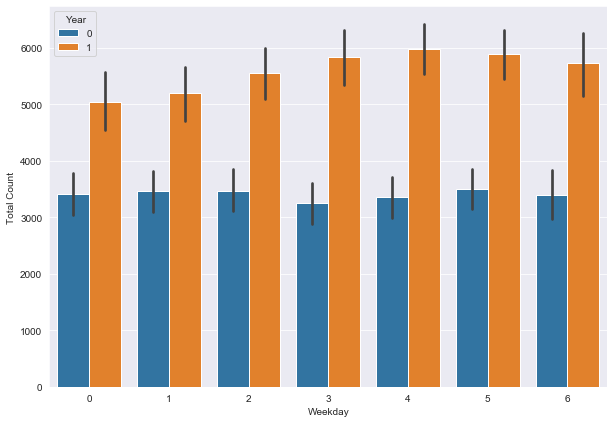

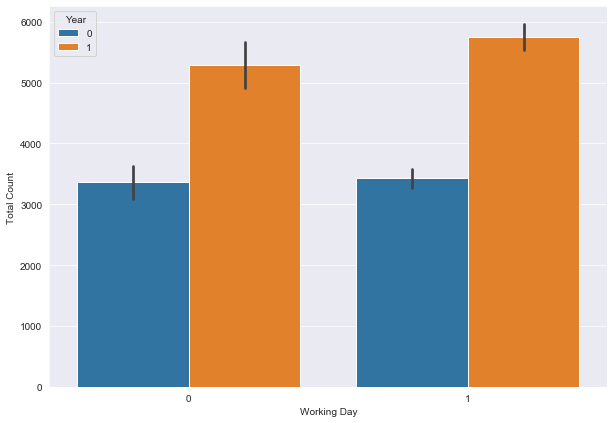

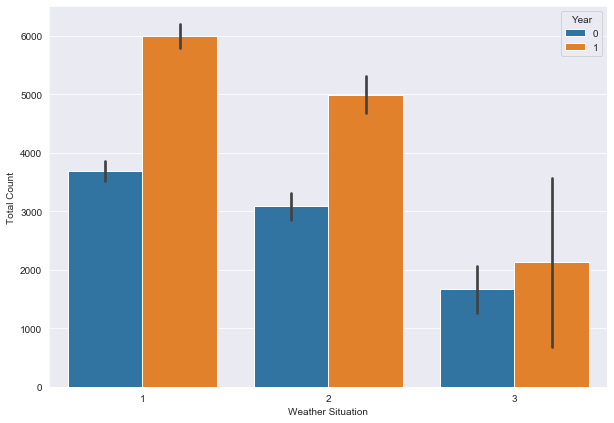

In [31]:
for i in df[['Season', 'Month', 'Holiday', 'Weekday', 'Working Day','Weather Situation']]:
    plt.figure(figsize=(10,7))
    sns.barplot(data=df,x=i,y='Total Count',hue='Year')

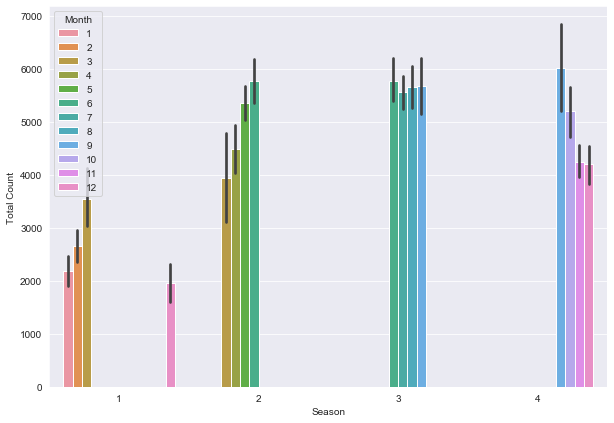

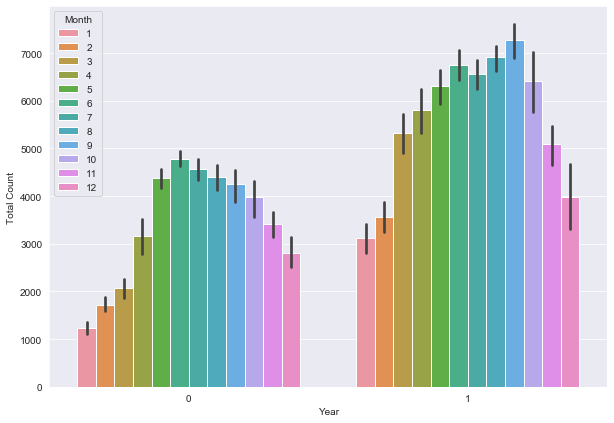

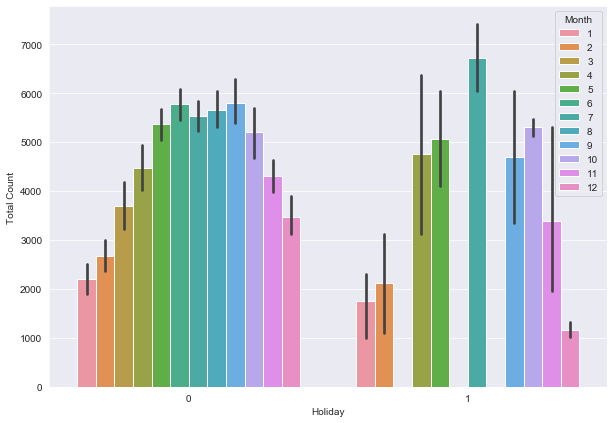

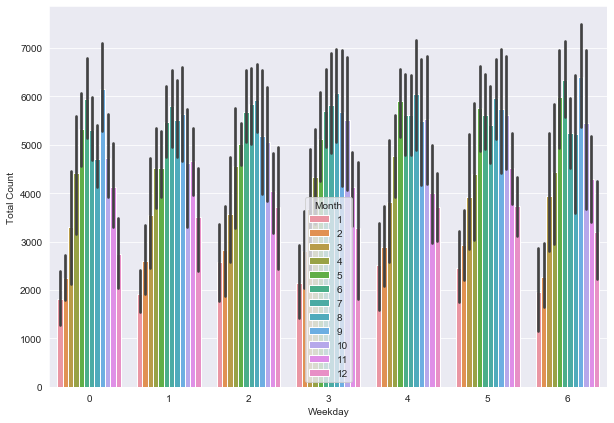

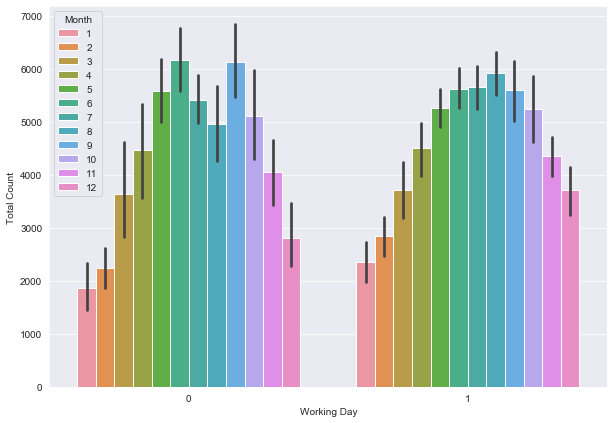

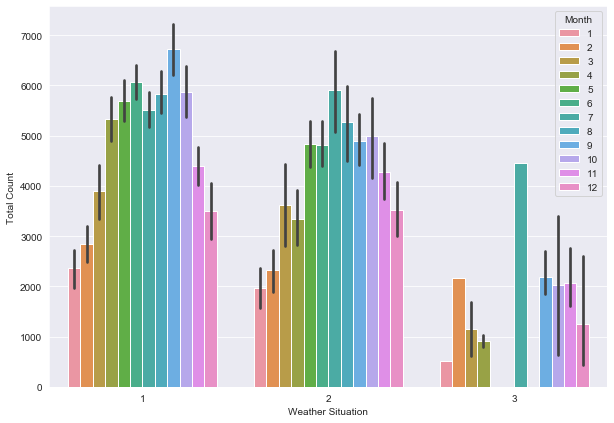

In [32]:
for i in df[['Season', 'Year', 'Holiday', 'Weekday', 'Working Day','Weather Situation']]:
    plt.figure(figsize=(10,7))
    sns.barplot(data=df,x=i,y='Total Count',hue='Month')

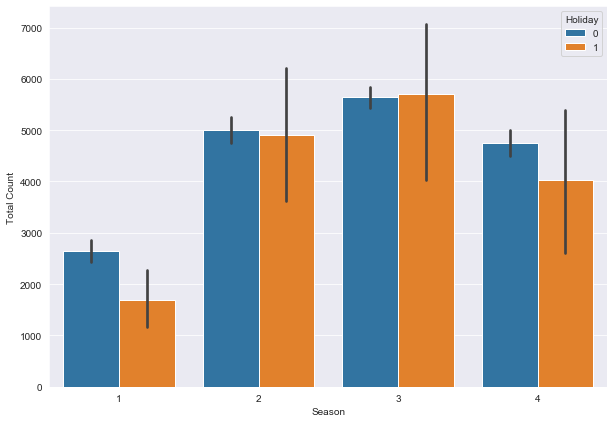

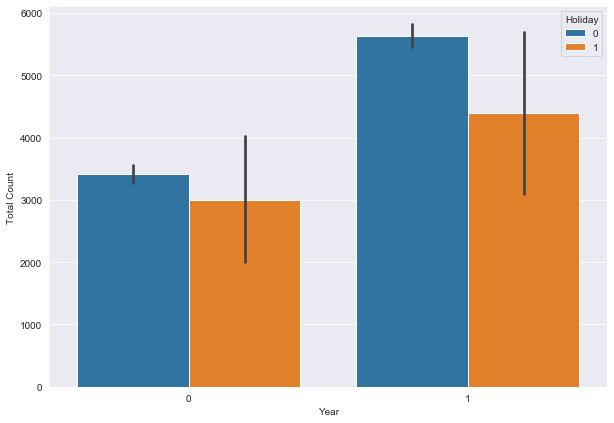

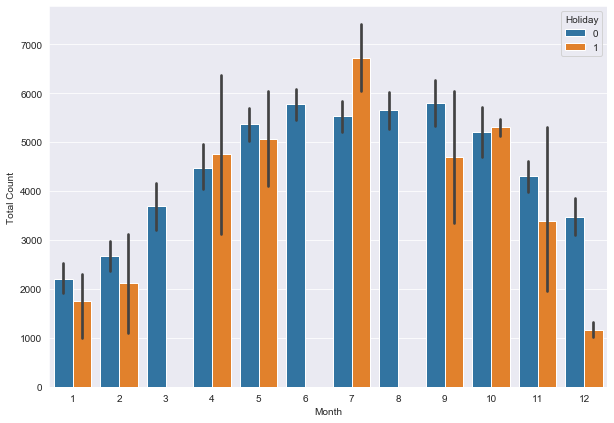

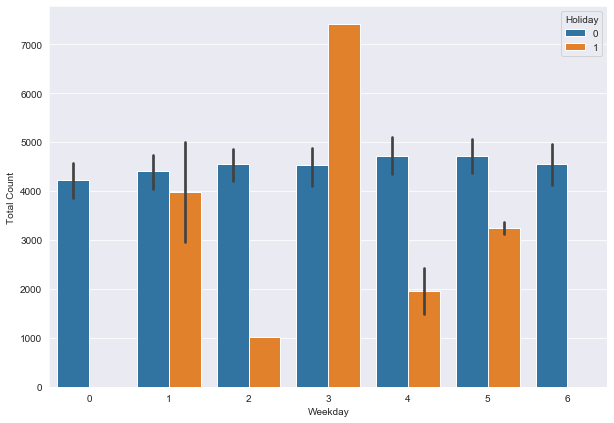

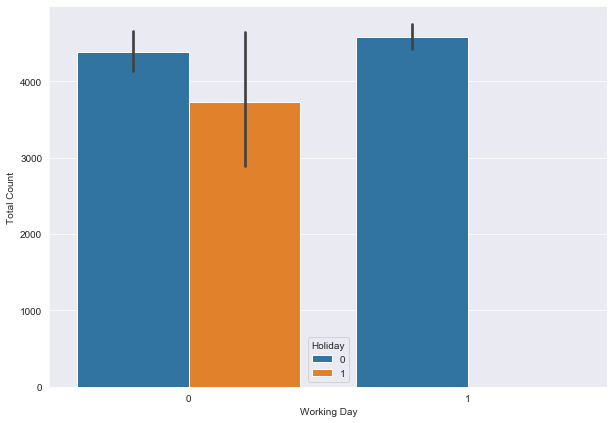

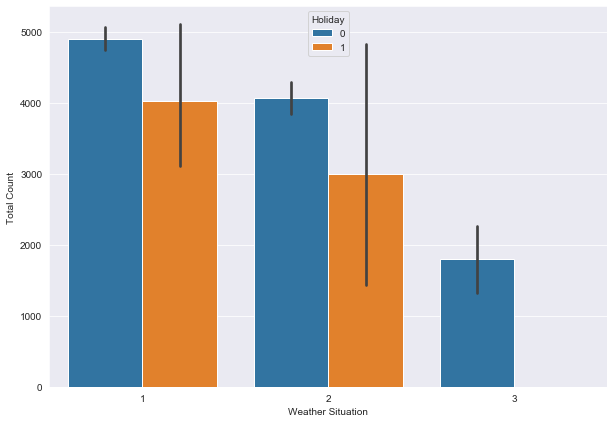

In [33]:
for i in df[['Season', 'Year','Month' , 'Weekday', 'Working Day','Weather Situation']]:
    plt.figure(figsize=(10,7))
    sns.barplot(data=df,x=i,y='Total Count',hue='Holiday')

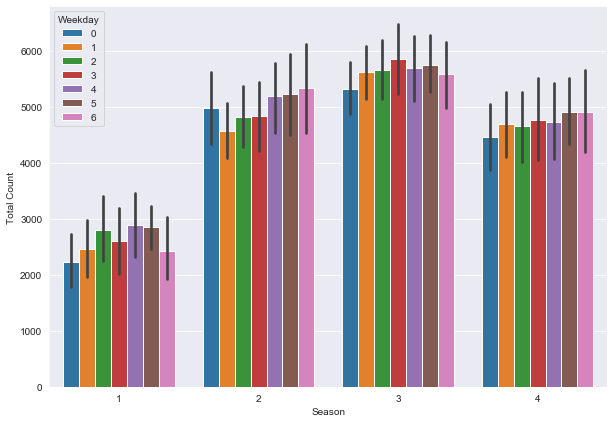

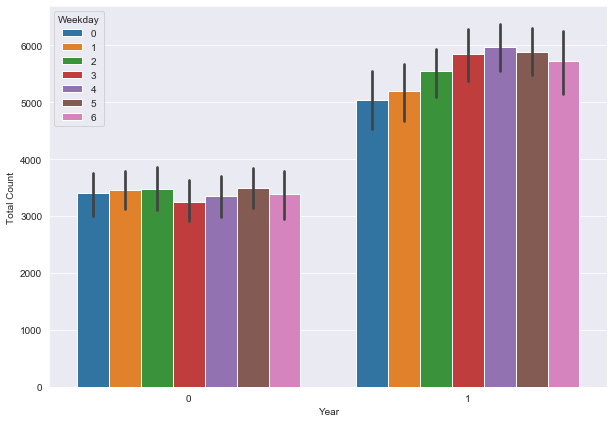

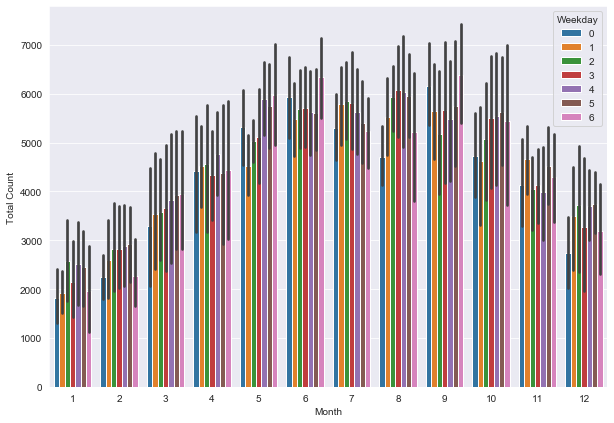

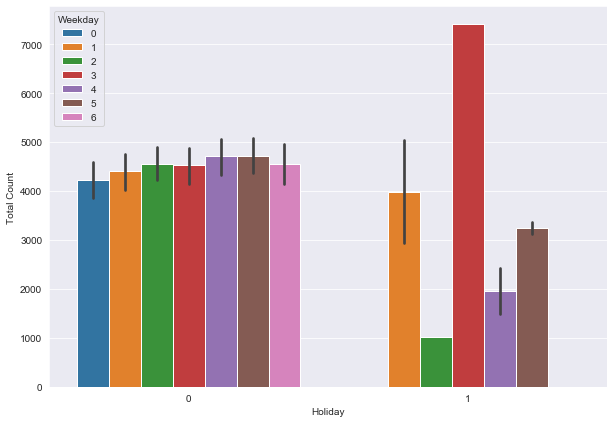

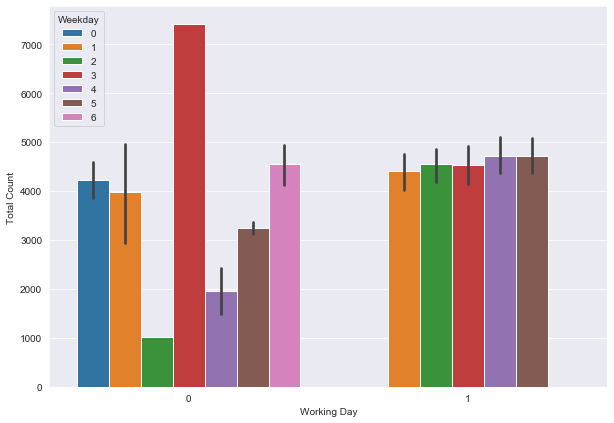

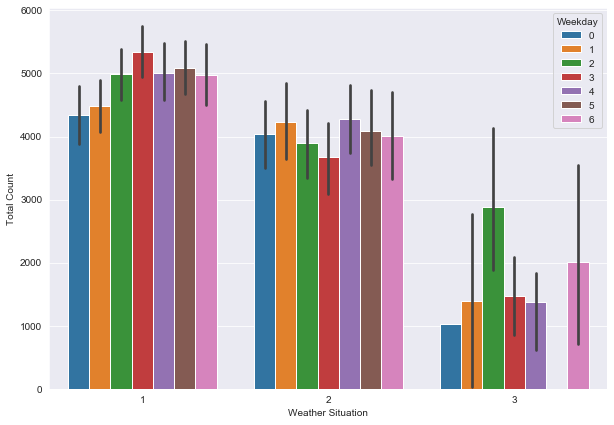

In [34]:
for i in df[['Season', 'Year','Month' ,'Holiday', 'Working Day','Weather Situation']]:
    plt.figure(figsize=(10,7))
    sns.barplot(data=df,x=i,y='Total Count',hue='Weekday')

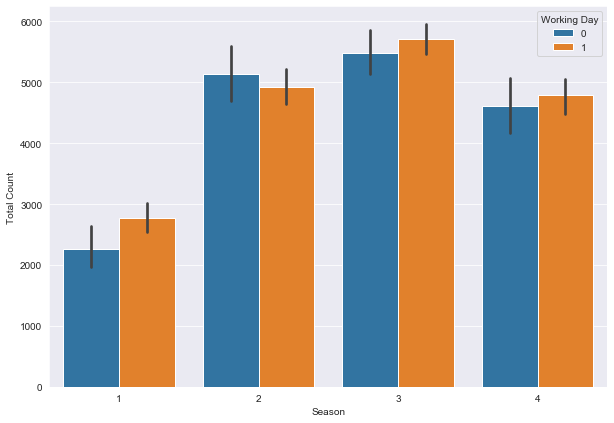

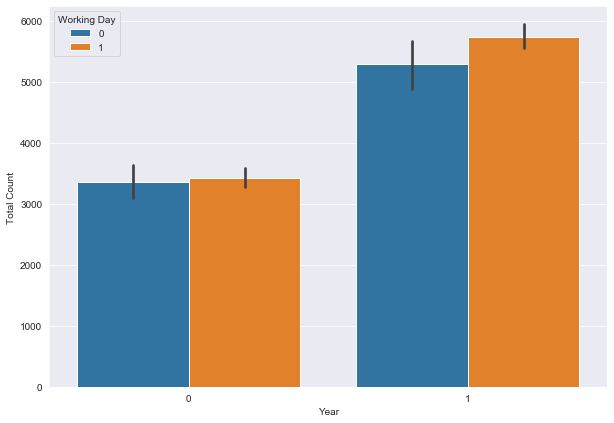

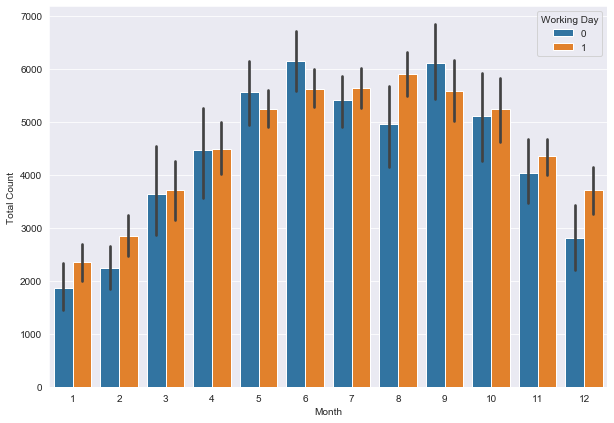

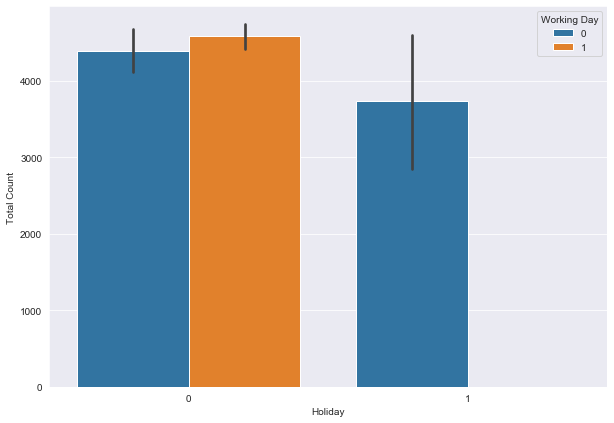

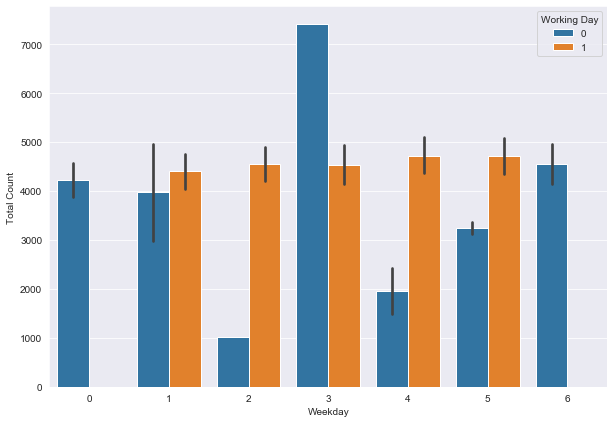

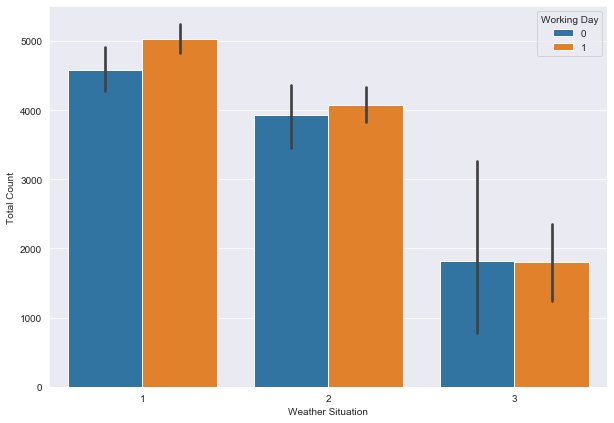

In [35]:
for i in df[['Season', 'Year','Month' ,'Holiday','Weekday' ,'Weather Situation']]:
    plt.figure(figsize=(10,7))
    sns.barplot(data=df,x=i,y='Total Count',hue='Working Day')

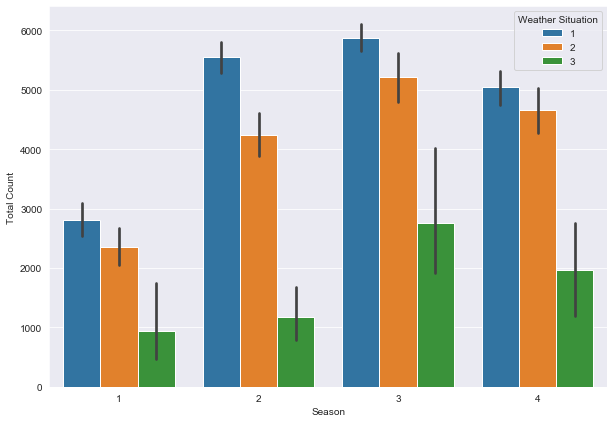

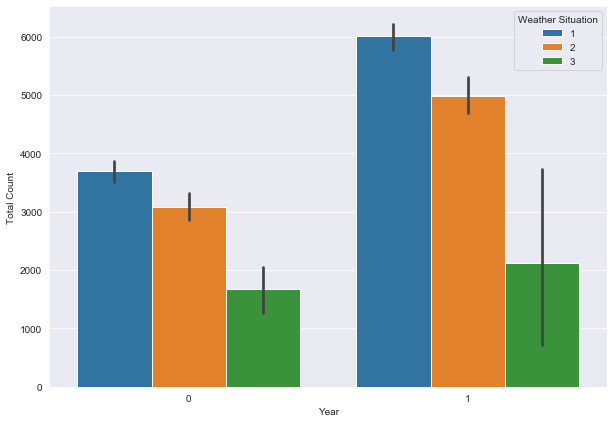

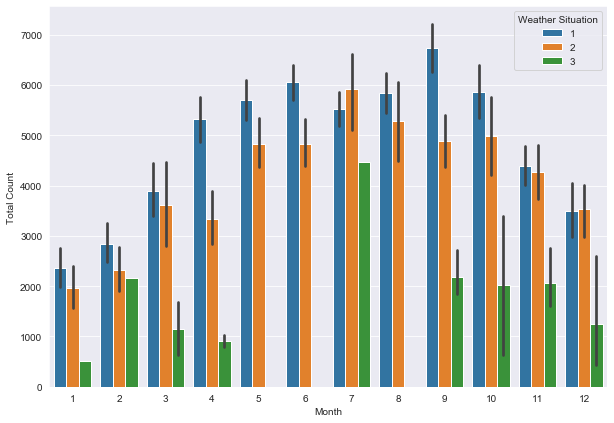

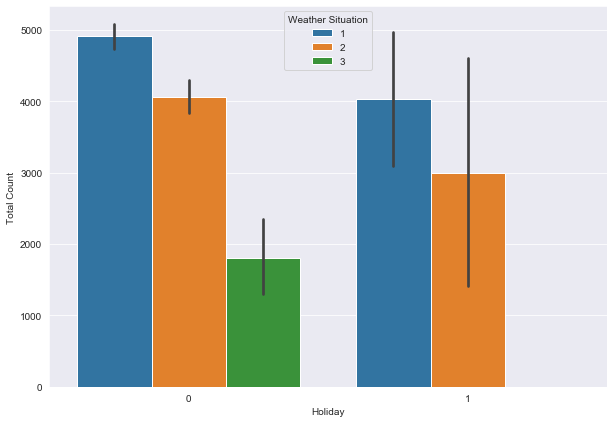

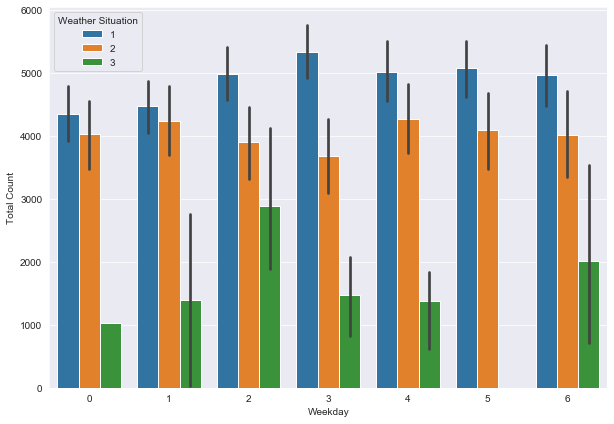

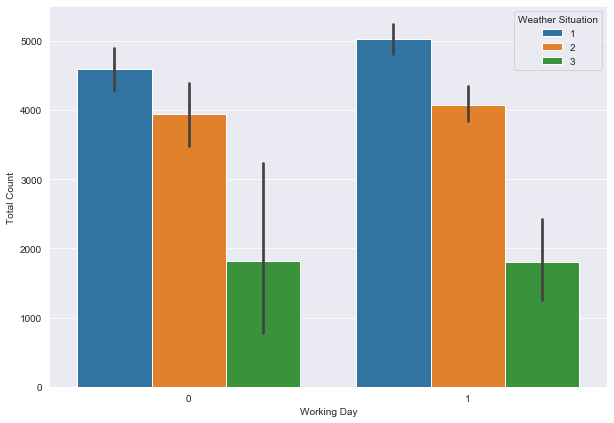

In [36]:
for i in df[['Season', 'Year','Month' ,'Holiday','Weekday' ,'Working Day']]:
    plt.figure(figsize=(10,7))
    sns.barplot(data=df,x=i,y='Total Count',hue='Weather Situation')

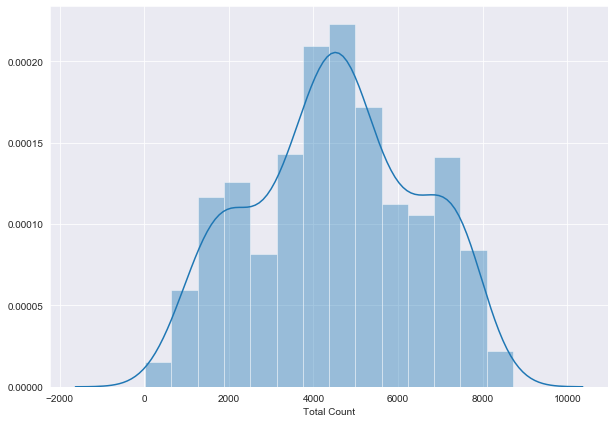

In [37]:
plt.figure(figsize=(10,7))
sns.distplot(df['Total Count'])

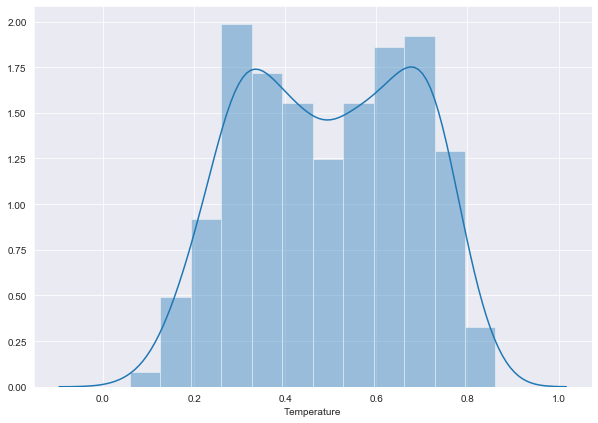

In [38]:
plt.figure(figsize=(10,7))
sns.distplot(df['Temperature'])

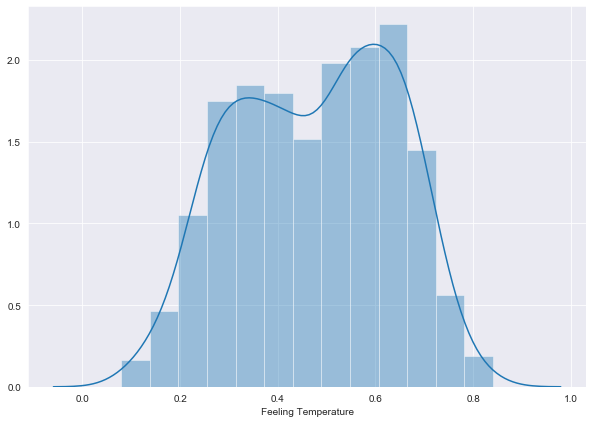

In [39]:
plt.figure(figsize=(10,7))
sns.distplot(df['Feeling Temperature'])

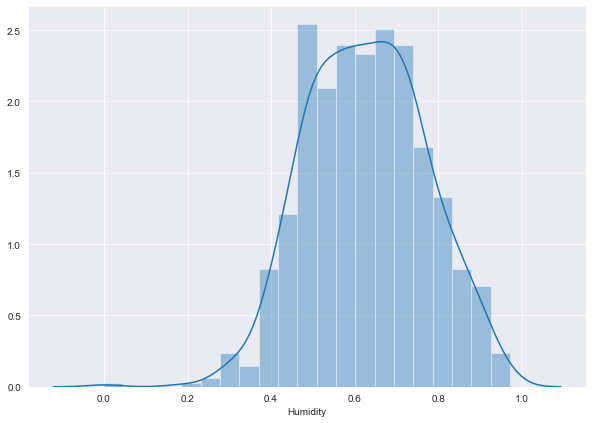

In [40]:
plt.figure(figsize=(10,7))
sns.distplot(df['Humidity'])

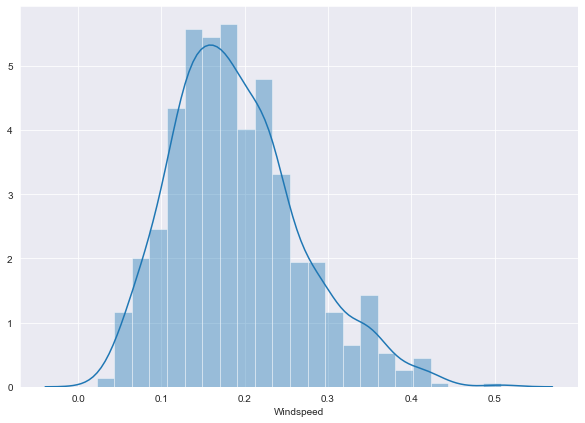

In [41]:
plt.figure(figsize=(10,7))
sns.distplot(df['Windspeed'])

## Outlier Analysis

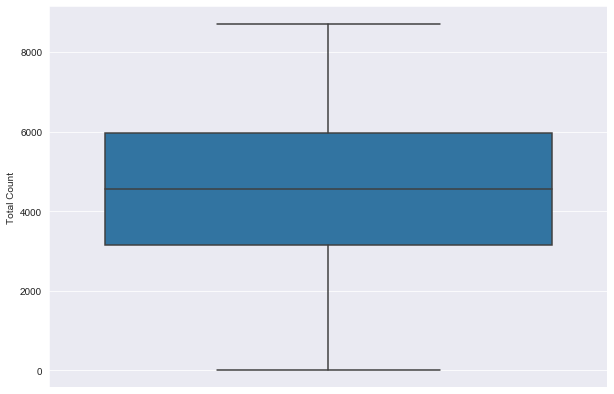

In [42]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Total Count')

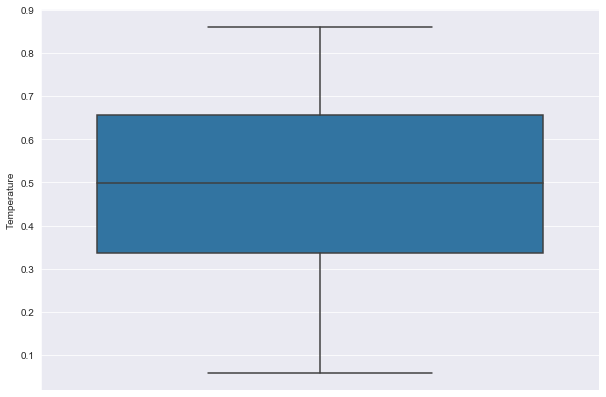

In [43]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Temperature')

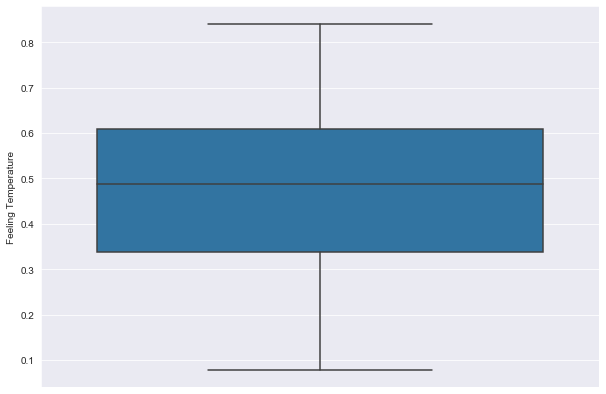

In [44]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Feeling Temperature')

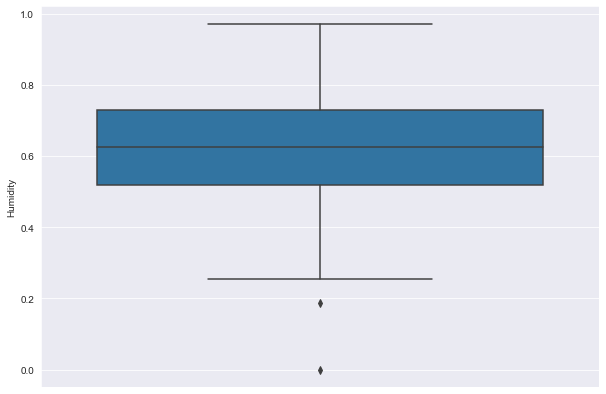

In [45]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Humidity')

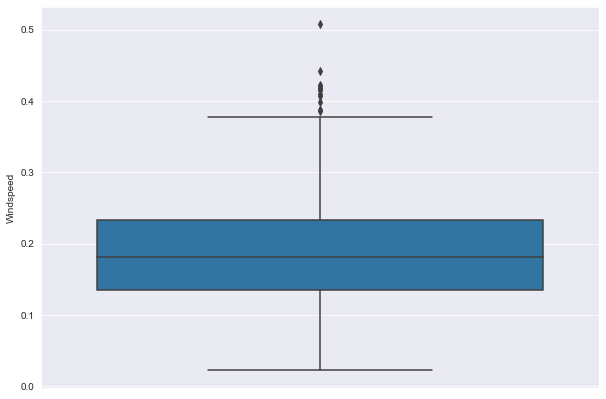

In [46]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Windspeed')

## Removing Outliers

In [47]:
columns = ["Temperature",'Feeling Temperature',"Humidity","Windspeed"]
for i in columns:
    print (i)
    q75,q25 = np.percentile(df.loc[:,i],[75,25])
    iqr = q75-q25
    
    min = q25 - (iqr*1.5)
    max = q75 + (iqr*1.5)
    print (min)
    print (max)
    
    df = df.drop(df[df.loc[:,i] < min].index)
    df = df.drop(df[df.loc[:,i] > max].index)

Temperature
-0.14041600000000015
1.1329160000000003
Feeling Temperature
-0.06829675000000018
1.0147412500000002
Humidity
0.20468725
1.0455212500000002
Windspeed
-0.012431000000000025
0.380585


## Analysis After Removing Outliers

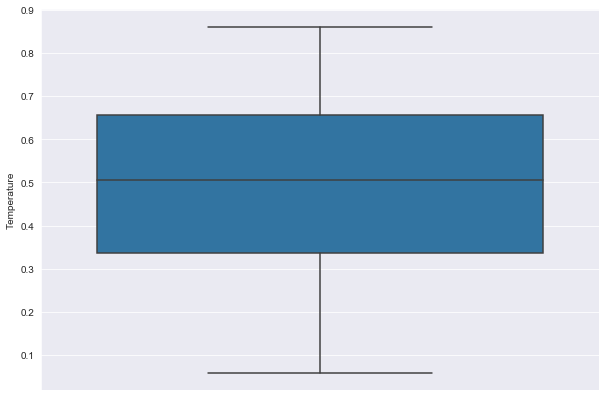

In [48]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Temperature')

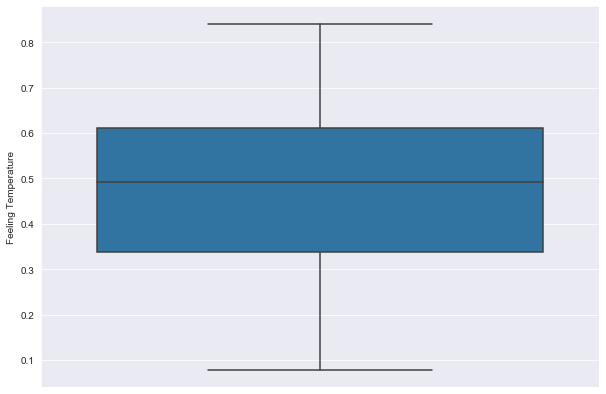

In [49]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Feeling Temperature')

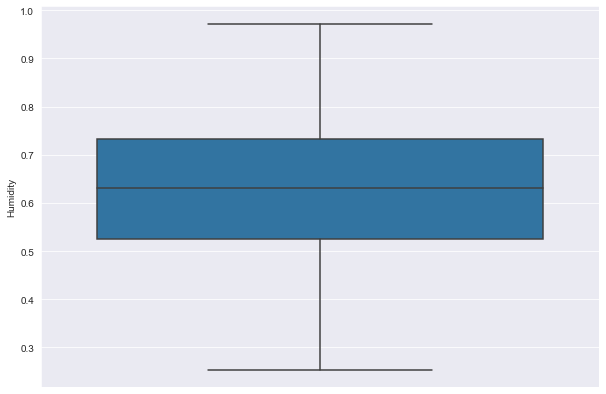

In [50]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Humidity')

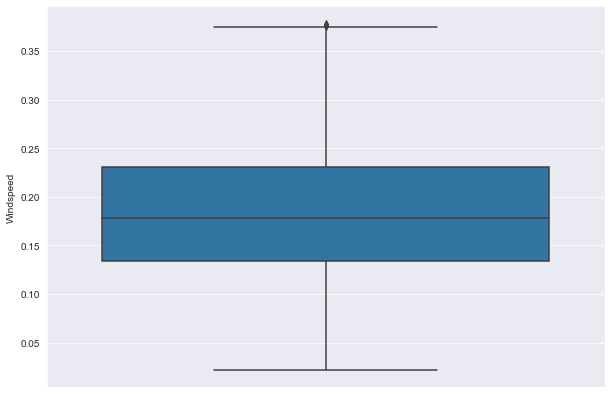

In [51]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df,y='Windspeed')

## Chi Sqaure Test

In [52]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2

In [53]:
stat, p, dof, expected = chi2_contingency(df.drop('Date',axis=1))
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Variables are Dependent (reject H0)')
else:
    print('Variables are Dependent Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Variables are Dependent Dependent (reject H0)')
else:
    print('Variables are Dependent Independent (fail to reject H0)')

dof=9308
[[5.48376361e-01 1.08944915e-01 1.43180398e+00 ... 1.86980210e+02
  8.02059769e+02 9.89039980e+02]
 [4.44878279e-01 8.83831432e-02 1.16157176e+00 ... 1.51690409e+02
  6.50682625e+02 8.02373034e+02]
 [7.48280875e-01 1.48659574e-01 1.95375223e+00 ... 2.55141770e+02
  1.09444175e+03 1.34958352e+03]
 ...
 [7.48641081e-01 1.48731136e-01 1.95469272e+00 ... 2.55264590e+02
  1.09496859e+03 1.35023318e+03]
 [9.98508437e-01 1.98371820e-01 2.60709334e+00 ... 3.40462009e+02
  1.46042664e+03 1.80088865e+03]
 [1.51566371e+00 3.01114099e-01 3.95737943e+00 ... 5.16796745e+02
  2.21682218e+03 2.73361893e+03]]
probability=0.950, critical=9533.556, stat=253886.983
Variables are Dependent (reject H0)
significance=0.050, p=0.000
Variables are Dependent Dependent (reject H0)


## Normality Test

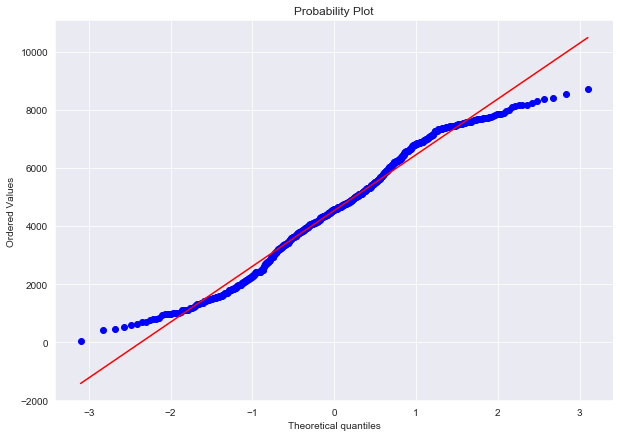

In [54]:
import scipy
from scipy import stats
plt.figure(figsize=(10,7))
stats.probplot(df['Total Count'].tolist(),dist='norm',plot=plt)
plt.show()

## Feature Selection

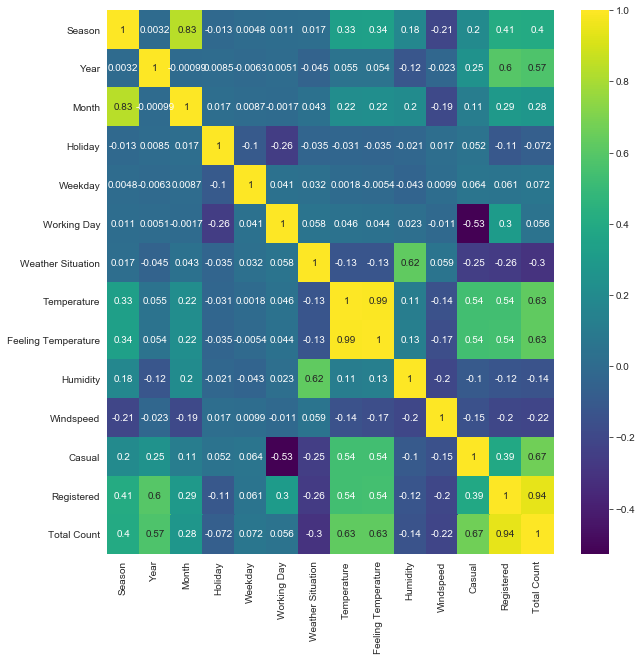

In [55]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),annot=True,cmap='viridis')

In [56]:
df.corr()['Total Count']

Season                 0.399284
Year                   0.573797
Month                  0.275745
Holiday               -0.071725
Weekday                0.071825
Working Day            0.056332
Weather Situation     -0.301418
Temperature            0.625892
Feeling Temperature    0.629204
Humidity              -0.136621
Windspeed             -0.216193
Casual                 0.670547
Registered             0.944581
Total Count            1.000000
Name: Total Count, dtype: float64

In [57]:
df.columns

Index(['Date', 'Season', 'Year', 'Month', 'Holiday', 'Weekday', 'Working Day',
       'Weather Situation', 'Temperature', 'Feeling Temperature', 'Humidity',
       'Windspeed', 'Casual', 'Registered', 'Total Count'],
      dtype='object')

In [58]:
#Dropping Casual and Registered due to their multicollinearity
#Working Day due low correlation with Total Count
#Dropping Feeling Temperature due to multicollinearity with Temperature
X = df[['Season', 'Year', 'Month', 'Holiday', 'Weekday',
       'Weather Situation', 'Temperature', 'Humidity',
       'Windspeed']]

In [59]:
y = df['Total Count']

## Splitting The Dataset

In [60]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

## Multiple Linear Regression

In [61]:
#Summary of Linear Regression by Ordinary Least Square Method
mod = sm.OLS(y, X)    # Describe model
res = mod.fit()       # Fit model
print(res.summary()) 

                                 OLS Regression Results                                
Dep. Variable:            Total Count   R-squared (uncentered):                   0.966
Model:                            OLS   Adj. R-squared (uncentered):              0.966
Method:                 Least Squares   F-statistic:                              2253.
Date:                Mon, 24 Aug 2020   Prob (F-statistic):                        0.00
Time:                        11:10:10   Log-Likelihood:                         -5898.7
No. Observations:                 717   AIC:                                  1.182e+04
Df Residuals:                     708   BIC:                                  1.186e+04
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

In [62]:
#Fitting The Linear Regression on Training Set
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [63]:
#Predictiion by Linear Regression Model on Test Set
pred_lr = lr.predict(X_test)

In [64]:
#Cross Validation Score and Standard Deviation 
from sklearn.model_selection import cross_val_score
CV_Score = cross_val_score(lr,  X = X_test, y = y_test, cv = 5)
print("CV_Score: {:.2f} %".format(CV_Score.mean()*100))
print("Standard Deviation: {:.2f} %".format(CV_Score.std()*100))

CV_Score: 83.99 %
Standard Deviation: 2.96 %


In [65]:
#  The intercept
print(lr.intercept_)

1774.3978046761217


In [66]:
#Coefficient Of Independent Variables in Regression
col = ['Season', 'Year', 'Month', 'Holiday', 'Weekday',
       'Weather Situation', 'Temperature', 'Humidity',
       'Windspeed']
coeff_df = pd.DataFrame(lr.coef_,col,columns=['Coefficient'])
coeff_df

,Coefficient
Season,497.177606
Year,2004.955784
Month,-34.707238
Holiday,-577.286852
Weekday,58.195412
Weather Situation,-511.325926
Temperature,5135.288956
Humidity,-1240.411007
Windspeed,-2647.978711


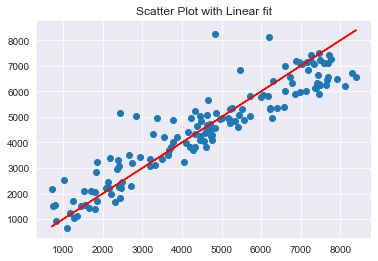

In [67]:
#Visualisation Of Linear Regression Prediction Model
plt.scatter(y_test, pred_lr)
plt.plot(y_test,y_test,color='red')
plt.title("Scatter Plot with Linear fit");

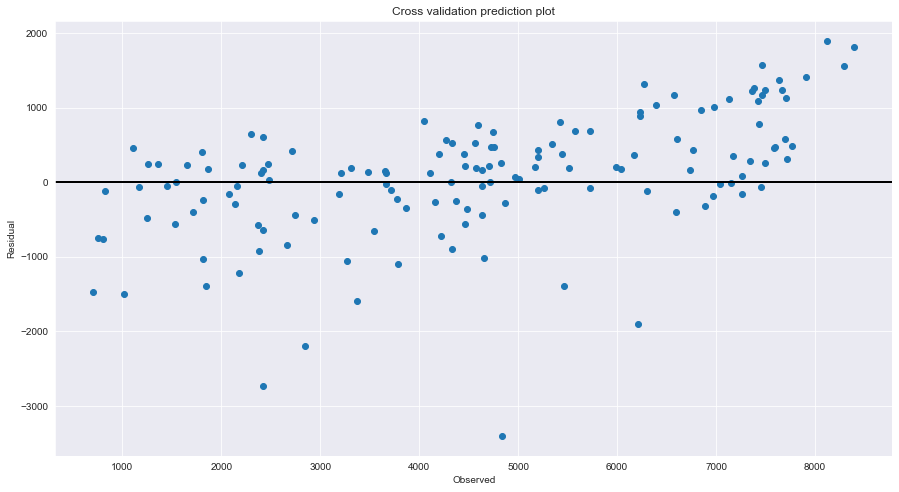

In [68]:
#Visualisation Of Residual Vs Actual 
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_test,y_test-pred_lr)
ax.axhline(lw=2,color='black')
ax.set_title('Cross validation prediction plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

In [69]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [70]:
#Model Evaluatiom
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_lr))
print('\n')
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_lr)))
print('\n')
print('r2_score:',r2_score(y_test,pred_lr))
print('\n')
print('Accuracy Of The Linear Regression Model:',lr.score(X_test,y_test)*100,'%')

Mean Absolute Error: 598.2340357934014


Root Mean Squared Error: 822.3674571230214


r2_score: 0.8495550188892319


Accuracy Of The Linear Regression Model: 84.9555018889232 %


In [71]:
#Adjusted r2 Score
n=X.shape[0]
p=X.shape[1]
R2 = r2_score(y_test,pred_lr)
Adj_r2 = 1-(1-R2)*(n-1)/(n-p-1)
Adj_r2

0.8476398776869731

## Decision Tree Regression

In [72]:
#Fitting The Decision Tree Regression on Training Set
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor(random_state = 0)
dtr.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [73]:
#Prediction by Decision Tree Regression on Test Set
pred_dtr = dtr.predict(X_test)

In [74]:
#Cross Validation Score and Standard Deviation 
CV_Score = cross_val_score(dtr, X = X_test, y = y_test, cv = 5)
print("CV_Score: {:.2f} %".format(CV_Score.mean()*100))
print("Standard Deviation: {:.2f} %".format(CV_Score.std()*100))

CV_Score: 73.94 %
Standard Deviation: 8.05 %


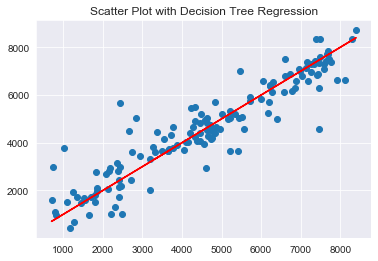

In [75]:
#Visualisation Of Decision Tree Regression Prediction Model
plt.scatter(y_test, pred_dtr)
plt.plot(y_test,y_test,color='red')
plt.title("Scatter Plot with Decision Tree Regression");

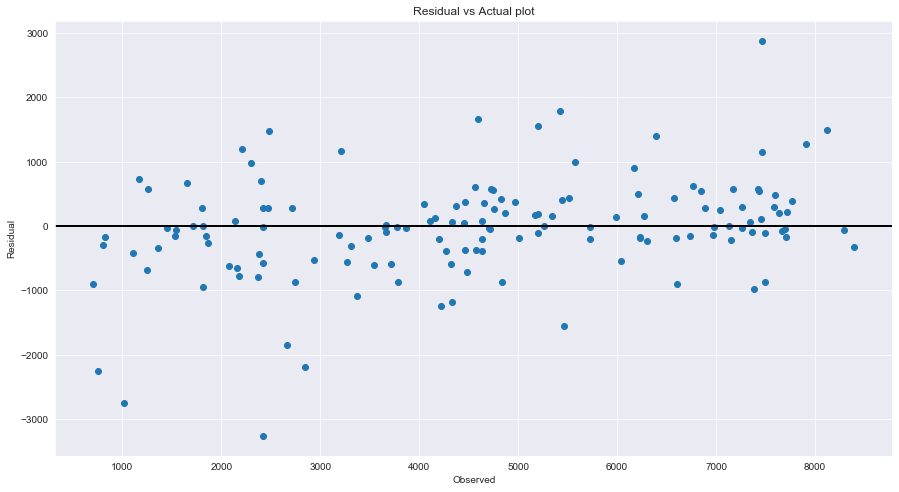

In [76]:
#Visualisation Of Residual Vs Actual 
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_test,y_test-pred_dtr)
ax.axhline(lw=2,color='black')
ax.set_title('Residual vs Actual plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

In [77]:
#Importing the Decision Tree Plot Libraries
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot
features = list(df[['Season', 'Year', 'Month', 'Holiday', 'Weekday',
       'Weather Situation', 'Temperature', 'Humidity',
       'Windspeed']])
features

C:\Users\Raaz\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


['Season',
 'Year',
 'Month',
 'Holiday',
 'Weekday',
 'Weather Situation',
 'Temperature',
 'Humidity',
 'Windspeed']

In [78]:
#Decision Tree Plot
dot_data = StringIO()  
export_graphviz(dtr, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())

In [79]:
#Model Evaluation
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_dtr))
print('\n')
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_dtr)))
print('\n')
print('r2_score:',r2_score(y_test,pred_dtr))
print('\n')
print('Accuracy Of The Decision Tree Regression Model:',dtr.score(X_test,y_test)*100,'%')

Mean Absolute Error: 536.2916666666666


Root Mean Squared Error: 793.9304912900121


r2_score: 0.8597797183149833


Accuracy Of The Decision Tree Regression Model: 85.97797183149834 %


In [80]:
#Adjusted r2 Score
n=X.shape[0]
p=X.shape[1]
R2 = r2_score(y_test,pred_dtr)
Adj_r2 = 1-(1-R2)*(n-1)/(n-p-1)
Adj_r2

0.8579947359455843

## Random Forest Regression Model

In [81]:
#Fitting The Random Forest Regression on Training Set
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor(n_estimators = 10, random_state = 0)
rfr.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=10, n_jobs=None, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [82]:
#Prediction by Random Forest Regression on Test Set
pred_rfr = rfr.predict(X_test)

In [83]:
#Cross Validation Score and Standard Deviation 
CV_Score = cross_val_score(rfr, X = X_test, y = y_test, cv = 5)
print("CV_Score: {:.2f} %".format(CV_Score.mean()*100))
print("Standard Deviation: {:.2f} %".format(CV_Score.std()*100))

CV_Score: 81.17 %
Standard Deviation: 4.36 %


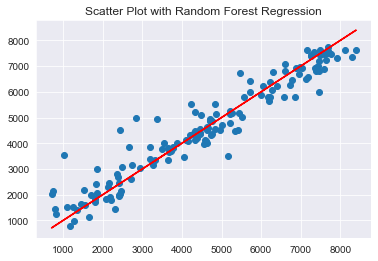

In [84]:
#Visualisation Of Random Forest Regression Prediction Model
plt.scatter(y_test, pred_rfr)
plt.plot(y_test,y_test,color='red')
plt.title("Scatter Plot with Random Forest Regression");

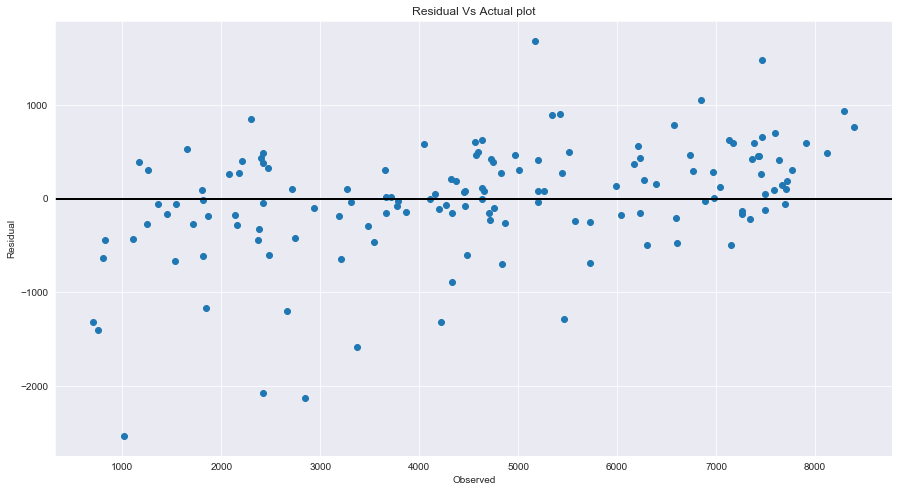

In [85]:
#Visualisation Of Residual Vs Actual 
fig,ax=plt.subplots(figsize=(15,8))
ax.scatter(y_test,y_test-pred_rfr)
ax.axhline(lw=2,color='black')
ax.set_title('Residual Vs Actual plot')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

Text(0.5, 0, 'Relative Importance')

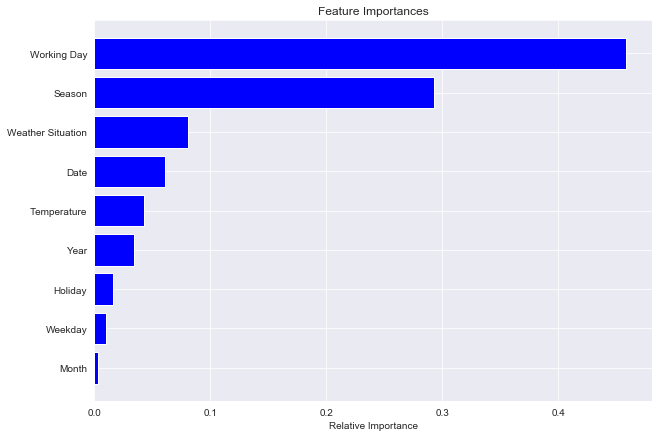

In [86]:
#Visualisation Of Relative Importance of Features 
features=df.columns
importances = rfr.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(10,7))
plt.figure(1)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [87]:
#Model Evaluation
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_rfr))
print('\n')
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_rfr)))
print('\n')
print('r2_score:',r2_score(y_test,pred_rfr))
print('\n')
print('Accuracy Of The Random Forest Regression Model:',rfr.score(X_test,y_test)*100,'%')

Mean Absolute Error: 432.0166666666667


Root Mean Squared Error: 614.182034972803


r2_score: 0.9160849050764414


Accuracy Of The Random Forest Regression Model: 91.60849050764413 %


In [88]:
#Adjusted r2 Score
n=X.shape[0]
p=X.shape[1]
R2 = r2_score(y_test,pred_rfr)
Adj_r2 = 1-(1-R2)*(n-1)/(n-p-1)
Adj_r2

0.9150166789741613

In [89]:
#Random Forest Regression has highest R2 score and accuracy so Final Model is Random Forest Regression

## Predicting a sample input

In [90]:
#Predicting a sample input
#('Season'=1,'Year'=1,'Month'=4,'Holiday'=1,'Weekday'=1,'Weather_Situation'=2,'Temperature'=27,'Humidity'=0.8,'Windspeed'=0.16)

In [91]:
Prediction = rfr.predict([[1,1,4,1,1,2,27,0.8,0.16]])

In [92]:
print('Prediction of Total Bike Renatl Count a sample input is',Prediction[0])

Prediction of Total Bike Renatl Count a sample input is 5573.1
